# PIMMS imputation by segment


Autoencoders need wide training data, i.e. a sample with all its features' intensities, whereas
Collaborative Filtering needs long training data, i.e. sample identifier a feature identifier and the intensity.


In [1]:
import os
from importlib import metadata

IN_COLAB = 'COLAB_GPU' in os.environ
if IN_COLAB:
    try:
        _v = metadata.version('pimms-learn')
        print(f"Running in colab and pimms-learn ({_v}) is installed.")
    except metadata.PackageNotFoundError:
        print("Install PIMMS...")
        # !pip install git+https://github.com/RasmussenLab/pimms.git@dev
        !pip install pimms-learn

import data

In [2]:
#training set
hihm_trs_na = 'hihm_trs_na.csv'
himm_trs_na = 'himm_trs_na.csv'
hilm_trs_na = 'hilm_trs_na.csv'
mihm_trs_na = 'mihm_trs_na.csv'
mimm_trs_na = 'mimm_trs_na.csv'
milm_trs_na = 'milm_trs_na.csv'
lihm_trs_na = 'lihm_trs_na.csv'
limm_trs_na = 'limm_trs_na.csv'
whole_trs_na = 'whole_trs_na.csv'
#testing set
hihm_tes_na = 'hihm_tes_na.csv'
himm_tes_na = 'himm_tes_na.csv'
hilm_tes_na = 'hilm_tes_na.csv'
mihm_tes_na = 'mihm_tes_na.csv'
mimm_tes_na = 'mimm_tes_na.csv'
milm_tes_na = 'milm_tes_na.csv'
lihm_tes_na = 'lihm_tes_na.csv'
limm_tes_na = 'limm_tes_na.csv'
whole_tes_na = 'whole_tes_na.csv'

In [3]:
os.getcwd()

'c:\\Users\\ys25.stu\\OneDrive - UBC\\BeeCSI\\Proteomics\\imputation'

Load package.

In [4]:
import logging
import random

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display

import pimmslearn.filter
import pimmslearn.plotting.data
import pimmslearn.sampling
from pimmslearn.plotting.defaults import color_model_mapping
from pimmslearn.sklearn.ae_transformer import AETransformer
from pimmslearn.sklearn.cf_transformer import CollaborativeFilteringTransformer

pimmslearn.plotting.make_large_descriptors(8)


logger = logger = pimmslearn.logging.setup_nb_logger()
logging.getLogger('fontTools').setLevel(logging.ERROR)

Parameters


In [19]:
#training set
hihm_trs_na: str = hihm_trs_na
himm_trs_na: str = himm_trs_na
hilm_trs_na: str = hilm_trs_na
mihm_trs_na: str = mihm_trs_na
mimm_trs_na: str = mimm_trs_na
milm_trs_na: str = milm_trs_na
lihm_trs_na: str = lihm_trs_na
limm_trs_na: str = limm_trs_na
whole_trs_na: str = whole_trs_na
#testing set
hihm_tes_na: str = hihm_tes_na
himm_tes_na: str = himm_tes_na
hilm_tes_na: str = hilm_tes_na
mihm_tes_na: str = mihm_tes_na
mimm_tes_na: str = mimm_tes_na
milm_tes_na: str = milm_tes_na
lihm_tes_na: str = lihm_tes_na
limm_tes_na: str = limm_tes_na
whole_tes_na: str = whole_tes_na

index_name: str = 'Sample ID'  # name of the index column
column_name: str = 'protein group'  # name of the column index
select_features: bool = False  # Whether to select features based on prevalence
feat_prevalence: float = 0.2  # minimum prevalence of a feature to be included
sample_completeness: float = 0.3  # minimum completeness of a sample to be included
sample_splits: bool = False  # Whether to sample validation and test data
frac_non_train: float = 0.0  # fraction of non training data (validation and test split)
frac_mnar: float = 0.0  # fraction of missing not at random data, rest: missing completely at random
random_state: int = 42  # random state for reproducibility

## Data

We will need the data in long format for Collaborative Filtering.
Naming both the row and column index assures
that the data can be transformed very easily into long format:

## hihm

In [37]:
hihm_trs_na = pd.read_csv(hihm_trs_na, index_col=0)
hihm_trs_na.index.name = index_name  # already set
hihm_trs_na.columns.name = column_name  # not set due to csv disk file format
hihm_trs_na.head()


protein group,AAADTLQGPM[15.9949]QAAYR,AAEEEEVDSADTGER,AAEFNSNLNR,AALEEVYPDLTPEETR,ADPAELR,ADTNQLADK,ADVLSEEAILK,AEDAGEVR,AESAEAAK,AEVHPAGDTAKEC[57.0215]METLLSSNASMK,...,WPVSYADR,WVTEIFSQIPNNGLPR,YELMRPSNK,YNYVAMDTEFPGVVAR,YPIC[57.0215]IELGQQDDFMSK,YQHGLGTPDLR,YTFAPSVSLNK,YVM[15.9949]TTTTLER,n[42.0106]AASVVC[57.0215]R,n[42.0106]MEAARPPPTAGK
Sample ID,,,,,,,,,,,,,,,,,,,,,
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.362,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Hela_100ng_11_8_2023_Slot2_93_12079.MaxLFQ.Intensity,NaN,18.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,18.257,18.552,NaN,NaN,NaN
Hela_100ng_10_9_2023_Slot2_89_11469.MaxLFQ.Intensity,NaN,NaN,NaN,NaN,18.449,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Hela_100ng_11_6_2023_Slot2_89_12021.MaxLFQ.Intensity,NaN,17.948,16.531,NaN,NaN,NaN,NaN,19.709,NaN,NaN,...,17.129,NaN,NaN,12.426,NaN,NaN,NaN,NaN,NaN,NaN
Hela_100ng_11_23_2023_Slot2_95_12326.MaxLFQ.Intensity,NaN,NaN,NaN,NaN,NaN,12.812,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,17.909,NaN,NaN,14.304,NaN,NaN


### Data selection
define a minimum feature and sample frequency for a feature to be included

In [38]:
df = hihm_trs_na
df.head()

protein group,AAADTLQGPM[15.9949]QAAYR,AAEEEEVDSADTGER,AAEFNSNLNR,AALEEVYPDLTPEETR,ADPAELR,ADTNQLADK,ADVLSEEAILK,AEDAGEVR,AESAEAAK,AEVHPAGDTAKEC[57.0215]METLLSSNASMK,...,WPVSYADR,WVTEIFSQIPNNGLPR,YELMRPSNK,YNYVAMDTEFPGVVAR,YPIC[57.0215]IELGQQDDFMSK,YQHGLGTPDLR,YTFAPSVSLNK,YVM[15.9949]TTTTLER,n[42.0106]AASVVC[57.0215]R,n[42.0106]MEAARPPPTAGK
Sample ID,,,,,,,,,,,,,,,,,,,,,
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.362,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Hela_100ng_11_8_2023_Slot2_93_12079.MaxLFQ.Intensity,NaN,18.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,18.257,18.552,NaN,NaN,NaN
Hela_100ng_10_9_2023_Slot2_89_11469.MaxLFQ.Intensity,NaN,NaN,NaN,NaN,18.449,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Hela_100ng_11_6_2023_Slot2_89_12021.MaxLFQ.Intensity,NaN,17.948,16.531,NaN,NaN,NaN,NaN,19.709,NaN,NaN,...,17.129,NaN,NaN,12.426,NaN,NaN,NaN,NaN,NaN,NaN
Hela_100ng_11_23_2023_Slot2_95_12326.MaxLFQ.Intensity,NaN,NaN,NaN,NaN,NaN,12.812,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,17.909,NaN,NaN,14.304,NaN,NaN


In [39]:
if select_features:
    # potentially this can take a few iterations to stabilize.
    df = pimmslearn.filter.select_features(df, feat_prevalence=feat_prevalence)
    df = pimmslearn.filter.select_features(df=df, feat_prevalence=sample_completeness, axis=1)
df.shape

(48, 267)

Transform to long-data format:

In [40]:
df = df.stack().to_frame('intensity')
df

intensity
Sample ID                                             protein group                        
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AEDAGEVR                       19.362
                                                      AHSTMTGSGVDAR                  14.214
                                                      AKGEVDVDVPK                    17.749
                                                      DGHGIC[57.0215]VISR            15.611
                                                      DIWLSLGVPASR                   17.558
...                                                                                     ...
Hela_100ng_11_22_2023_Slot1_91_12296.MaxLFQ.Intensity VQESNALR                       18.372
                                                      VSM[15.9949]EEQR               19.150
                                                      VVDTSIDSVTLAWTPVSR             19.038
                                                      YVM[15.9949]TTTTLER            19.652
                                                      n[42.0106]AASVVC[57.0215]R     18.173

[1943 rows x 1 columns]

## Collaborative filtering

In [ ]:
CollaborativeFilteringTransformer?

Init signature:
CollaborativeFilteringTransformer(
    target_column: 'str',
    sample_column: 'str',
    item_column: 'str',
    n_factors: 'int' = 15,
    out_folder: 'str' = '.',
    batch_size: 'int' = 4096,
)
Docstring:     
Collaborative Filtering transformer.

Collaborative filtering operates on long data specifying two identifiers
(sample and feature) with a quantitative value to predict. Therefore we need to specify
three columns. The sample and feature identifiers are embedded into a space which is
then used to predict the quantitative value.

The data is expected as a Series with a MultiIndex of the sample and feature identifiers,
and the quantitative value as its values.

Parameters
----------
target_column : str
    Target column name to predict, e.g. intensity
item_column: str
    Column name for features (items) to embed, e.g. peptides
sample_column: str
    Sample column name, e.g. Sample_ID
n_factors : int, optional
    number of dimension of item and sample embedding

Let's set up collaborative filtering without a validation or test set, using
all the data there is.

In [ ]:
cf_model = CollaborativeFilteringTransformer(
    target_column='intensity',
    sample_column='Sample ID',
    item_column='protein group',
    out_folder='runs/scikit_interface')

We use `fit` and `transform` to train the model and impute the missing values.
> Scikit learns interface requires a `X` and `y`. `y` is the validation data in our context.
> We might have to change the interface to allow usage within pipelines (-> `y` is not needed).
> This will probably mean setting up a validation set within the model.

In [ ]:
cf_model.fit(splits.train_X,
             splits.val_y,
             cuda=False,
             epochs_max=20,
             )

ZeroDivisionError: integer division or modulo by zero

Impute missing values usin `transform` method:

In [ ]:
df_imputed = cf_model.transform(df).unstack()
assert df_imputed.isna().sum().sum() == 0
df_imputed.head()

protein group,AAADTLQGPM[15.9949]QAAYR,AAEEEEVDSADTGER,AAEFNSNLNR,AALEEVYPDLTPEETR,ADPAELR,ADTNQLADK,ADVLSEEAILK,AEDAGEVR,AESAEAAK,AEVHPAGDTAKEC[57.0215]METLLSSNASMK,...,YQDEC[57.0215]QAHTQAK,YQELTQEC[57.0215]DEK,YSSSSLSHMGAYSR,YVHELIPAVMTC[57.0215]IVSR,YVQEDSC[57.0215]QHGVYGR,YYEDKPQGGAC[57.0215]AGLK,n[42.0106]DPNC[57.0215]SC[57.0215]ATGGSC[57.0215]TC[57.0215]AGSC[57.0215]K,n[42.0106]MEGLVVAAGGDVSLHNFSAR,n[42.0106]MMTSVSSDHC[57.0215]R,n[42.0106]STASSSSSSSSSQTPHPPSQR
Sample ID,,,,,,,,,,,,,,,,,,,,,
Hela_100ng_10_11_2023_Slot1_95_11495.MaxLFQ.Intensity,16.863,17.445,16.489,17.333,14.555,14.807,17.547,17.745,17.686,19.000,...,11.610,11.610,11.852,12.319,11.738,10.945,9.783,12.637,12.048,11.437
Hela_100ng_10_12_2023_Slot1_93_11527.MaxLFQ.Intensity,16.715,17.483,16.258,17.725,15.185,14.646,17.526,18.578,18.003,18.922,...,11.512,11.750,11.953,11.855,11.678,11.431,9.137,11.919,12.117,11.009
Hela_100ng_10_12_2023_Slot1_94_11511.MaxLFQ.Intensity,16.742,17.364,16.345,17.305,14.572,14.861,17.383,17.834,17.712,18.777,...,11.467,11.738,11.961,12.188,11.690,11.584,10.185,12.140,11.837,11.467
Hela_100ng_10_13_2023_Slot1_92_11543.MaxLFQ.Intensity,16.675,17.466,16.288,17.452,7.750,14.624,17.418,17.977,17.698,18.891,...,11.638,12.393,11.873,12.268,11.695,12.071,10.176,11.274,12.039,11.620
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity,16.449,17.596,16.098,18.168,16.540,13.682,17.435,19.362,18.066,19.110,...,10.893,12.151,11.955,11.909,11.299,11.698,9.984,11.718,11.678,12.382


loop over regions and data types

In [51]:
#hihm not suitable for cf
regions = ["himm", "hilm", "mihm", "mimm", "milm", "lihm", "limm", "whole"]
data_types = ["trs", "tes"]
data_files = {region + "_" + data_type + "_na": f"{region}_{data_type}_na.csv" for region in regions for data_type in data_types}
data_files

{'himm_trs_na': 'himm_trs_na.csv',
 'himm_tes_na': 'himm_tes_na.csv',
 'hilm_trs_na': 'hilm_trs_na.csv',
 'hilm_tes_na': 'hilm_tes_na.csv',
 'mihm_trs_na': 'mihm_trs_na.csv',
 'mihm_tes_na': 'mihm_tes_na.csv',
 'mimm_trs_na': 'mimm_trs_na.csv',
 'mimm_tes_na': 'mimm_tes_na.csv',
 'milm_trs_na': 'milm_trs_na.csv',
 'milm_tes_na': 'milm_tes_na.csv',
 'lihm_trs_na': 'lihm_trs_na.csv',
 'lihm_tes_na': 'lihm_tes_na.csv',
 'limm_trs_na': 'limm_trs_na.csv',
 'limm_tes_na': 'limm_tes_na.csv',
 'whole_trs_na': 'whole_trs_na.csv',
 'whole_tes_na': 'whole_tes_na.csv'}

Processing himm_trs
Train_X shape: (4852, 1)
Val_Y shape: (4852, 1)
Train_X shape: (41488, 1)
                                                                          intensity
Sample ID                                             protein group                
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAALQYPSPSAAQDMVER     14.917
                                                      AAEDSPYWVSPAYSK        15.569
                                                      AAFNSGK                19.447
                                                      AALEAVGGTVVLE          16.344
                                                      AALQMQFNAAER           16.002


suggested_lr.valley = 0.00759


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2.422541,2.365719,00:00
1,2.357042,2.227630,00:00
2,2.247802,1.962261,00:00
3,2.093105,1.496969,00:00
4,1.857182,1.020424,00:00
5,1.610835,0.814428,00:00
6,1.402867,0.698022,00:00
7,1.231398,0.623192,00:00
8,1.089388,0.569031,00:00
9,0.974841,0.527709,00:00


Processing himm_tes
Train_X shape: (41488, 1)
Val_Y shape: (41488, 1)
Train_X shape: (25508, 1)
                                                                                intensity
Sample ID                                             protein group                      
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAFNSGK                      21.038
                                                      AALEAVGGTVVLE                15.635
                                                      AALQMQFNAAER                 15.825
                                                      AAQLC[57.0215]GAGMAAVVDK     15.949
                                                      AAQNSGEAEYIEK                17.043


suggested_lr.valley = 0.00759


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2.051196,2.066257,00:00
1,2.055719,2.023501,00:00
2,2.024865,1.934246,00:00
3,1.972737,1.766557,00:00
4,1.885917,1.481102,00:00
5,1.761442,1.167436,00:00
6,1.624570,0.929911,00:00
7,1.484318,0.772067,00:00
8,1.352960,0.669402,00:00
9,1.237699,0.596979,00:00


Processing hilm_trs
Train_X shape: (25508, 1)
Val_Y shape: (25508, 1)
Train_X shape: (1095436, 1)
                                                                                     intensity
Sample ID                                             protein group                           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAAAAAPAAAATAPTTAATTAATAAQ     18.013
                                                      AAAAAWEEPSSGNGTAR                 16.855
                                                      AAAASAAEAGIATTGTEDSDDALLK         17.354
                                                      AAAEAAAEAK                        16.482
                                                      AAAEGLMSLLR                       15.602


suggested_lr.valley = 0.00525


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1.811841,1.524305,00:03
1,0.368701,0.303858,00:03
2,0.284037,0.267150,00:03
3,0.174091,0.159086,00:03
4,0.123795,0.118326,00:03
5,0.103144,0.100760,00:03
6,0.092274,0.091607,00:03
7,0.086752,0.085343,00:04
8,0.081381,0.080463,00:04
9,0.077493,0.076228,00:04


Processing hilm_tes
Train_X shape: (1095436, 1)
Val_Y shape: (1095436, 1)
Train_X shape: (727352, 1)
                                                                                     intensity
Sample ID                                             protein group                           
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAAAAAPAAAATAPTTAATTAATAAQ     17.865
                                                      AAAAAAAK                          16.109
                                                      AAAAAAALQAK                       18.724
                                                      AAAAAWEEPSSGNGTAR                 16.769
                                                      AAAASAAEAGIATTGTEDSDDALLK         17.175


suggested_lr.valley = 0.00437


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2.138735,1.975422,00:02
1,0.835080,0.479372,00:02
2,0.362499,0.343261,00:02
3,0.267479,0.230898,00:02
4,0.174984,0.157328,00:02
5,0.129346,0.116729,00:02
6,0.098187,0.094597,00:02
7,0.085809,0.081585,00:02
8,0.075524,0.073178,00:02
9,0.067793,0.066400,00:02


Processing mihm_trs
Train_X shape: (727352, 1)
Val_Y shape: (727352, 1)
Train_X shape: (85970, 1)
                                                                     intensity
Sample ID                                             protein group           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAPGNGR         14.925
                                                      AAAEPSPR           9.791
                                                      AADMLSGPR         13.081
                                                      AAEDLFVNIR        14.994
                                                      AAELQAQWER        14.230


suggested_lr.valley = 0.00437


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1.812396,1.793543,00:00
1,1.755208,1.642970,00:00
2,1.627518,1.330042,00:00
3,1.398900,0.807466,00:00
4,1.091985,0.455362,00:00
5,0.835752,0.334394,00:00
6,0.647391,0.275380,00:00
7,0.512421,0.235360,00:00
8,0.410497,0.205876,00:00
9,0.337512,0.182513,00:00


Processing mihm_tes
Train_X shape: (85970, 1)
Val_Y shape: (85970, 1)
Train_X shape: (83775, 1)
                                                                     intensity
Sample ID                                             protein group           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAPGNGR         14.925
                                                      AAAEPSPR           9.791
                                                      AADMLSGPR         13.081
                                                      AAEDLFVNIR        14.994
                                                      AAELQAQWER        14.230


suggested_lr.valley = 0.00525


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1.811646,1.777892,00:00
1,1.743759,1.600142,00:00
2,1.594990,1.228705,00:00
3,1.319643,0.650251,00:00
4,0.998391,0.376466,00:00
5,0.750861,0.284962,00:00
6,0.576673,0.233524,00:00
7,0.449848,0.196095,00:00
8,0.357559,0.166621,00:00
9,0.289447,0.142977,00:00


Processing mimm_trs
Train_X shape: (83775, 1)
Val_Y shape: (83775, 1)
Train_X shape: (527951, 1)
                                                                                                                      intensity
Sample ID                                             protein group                                                            
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAATAPPSPGPAQPGPR                                               13.784
                                                      AAAAADLANR                                                         14.576
                                                      AAAAASAAGPGGLVAGKEEK                                               14.113
                                                      AAAAC[57.0215]LDK                                                  15.133
                                                      AAAATGGTGPGAGIGAATGTGGSSEPSAC[57.0215]SDHPIPGC[57.0215]SLKEEEK     13.119


suggested_lr.valley = 0.00251


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2.480812,2.365948,00:02
1,1.857265,1.432982,00:01
2,0.693108,0.429320,00:01
3,0.394169,0.352649,00:02
4,0.324512,0.303391,00:01
5,0.268811,0.248856,00:01
6,0.224565,0.209862,00:01
7,0.190184,0.179955,00:01
8,0.165589,0.155472,00:01
9,0.144331,0.136445,00:01


Processing mimm_tes
Train_X shape: (527951, 1)
Val_Y shape: (527951, 1)
Train_X shape: (328431, 1)
                                                                                                                      intensity
Sample ID                                             protein group                                                            
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAATAPPSPGPAQPGPR                                               13.683
                                                      AAAAADLANR                                                         14.706
                                                      AAAAASAAGPGGLVAGKEEK                                               13.383
                                                      AAAAC[57.0215]LDK                                                  16.398
                                                      AAAATGGTGPGAGIGAATGTGGSSEPSAC[57.0215]SDHPIPGC[57.0215]SLKEEEK     13.341


suggested_lr.valley = 0.00209


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2.687529,2.607498,00:01
1,2.387812,2.087879,00:01
2,1.550109,0.865160,00:01
3,0.703276,0.400775,00:01
4,0.425536,0.340285,00:01
5,0.341101,0.310430,00:01
6,0.306454,0.288585,00:01
7,0.281790,0.267805,00:01
8,0.259319,0.245927,00:01
9,0.237470,0.220775,00:01


Processing milm_trs
Train_X shape: (328431, 1)
Val_Y shape: (328431, 1)
Train_X shape: (779938, 1)
                                                                                 intensity
Sample ID                                             protein group                       
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAAAAAK                    13.791
                                                      AAAAAAAAVPSAGPAGPAPTSAAGR     14.652
                                                      AAAAALSQQQSLQER               14.626
                                                      AAAAPFQTSQASASAPR             14.940
                                                      AAAASVPNADGLK                 14.022


suggested_lr.valley = 0.00302


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,4.551138,4.271873,00:02
1,1.796955,0.801713,00:02
2,0.293525,0.245024,00:02
3,0.248898,0.248376,00:02


No improvement since epoch 2: early stopping


Processing milm_tes
Train_X shape: (779938, 1)
Val_Y shape: (779938, 1)
Train_X shape: (512879, 1)
                                                                                 intensity
Sample ID                                             protein group                       
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAAAAAK                    15.224
                                                      AAAAAAAAVPSAGPAGPAPTSAAGR     14.665
                                                      AAAAALSQQQSLQER               14.482
                                                      AAAAPFQTSQASASAPR             14.769
                                                      AAAASVPNADGLK                 14.445


suggested_lr.valley = 0.00251


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1.703302,1.606541,00:01
1,1.159889,0.782307,00:01
2,0.382414,0.259401,00:01
3,0.266769,0.257330,00:01
4,0.251268,0.244526,00:01
5,0.204213,0.175423,00:01
6,0.150415,0.135956,00:01
7,0.121680,0.111969,00:01
8,0.098897,0.092090,00:01
9,0.083356,0.077324,00:01


Processing lihm_trs
Train_X shape: (512879, 1)
Val_Y shape: (512879, 1)
Train_X shape: (83133, 1)
                                                                                  intensity
Sample ID                                             protein group                        
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AADDSKEVESFQQLLNAR             12.240
                                                      AADISLDNLVEGKR                 12.650
                                                      AAEALHGEADSSGVLAAVDATVNK       11.247
                                                      AAELTATQVEEEEEEEDFR            12.012
                                                      AAHTEDINAC[57.0215]TLTTSPR     12.304


suggested_lr.valley = 0.00251


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,3.711851,3.681281,00:00
1,3.654233,3.526103,00:00
2,3.517082,3.179821,00:00
3,3.247294,2.532264,00:00
4,2.791687,1.602351,00:00
5,2.215668,0.914787,00:00
6,1.690632,0.593153,00:00
7,1.280479,0.445899,00:00
8,0.980959,0.367830,00:00
9,0.764333,0.320290,00:00


Processing lihm_tes
Train_X shape: (83133, 1)
Val_Y shape: (83133, 1)
Train_X shape: (72157, 1)
                                                                                intensity
Sample ID                                             protein group                      
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AADDSKEVESFQQLLNAR           12.240
                                                      AADISLDNLVEGKR               12.650
                                                      AAEALHGEADSSGVLAAVDATVNK     11.247
                                                      AAELTATQVEEEEEEEDFR          12.012
                                                      AAIWESQHEGPEGAR              12.384


suggested_lr.valley = 0.00437


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,3.664797,3.635882,00:00
1,3.593246,3.409442,00:00
2,3.400769,2.892531,00:00
3,3.025992,1.900862,00:00
4,2.426159,0.862875,00:00
5,1.827809,0.473060,00:00
6,1.369937,0.338449,00:00
7,1.037900,0.269957,00:00
8,0.796781,0.228137,00:00
9,0.622413,0.198812,00:00


Processing limm_trs
Train_X shape: (72157, 1)
Val_Y shape: (72157, 1)
Train_X shape: (8348, 1)
                                                                                             intensity
Sample ID                                             protein group                                   
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAIDAVDNKK                                12.489
                                                      AALEAQNALHNM[15.9949]K                    11.971
                                                      ADAINSTQSTALHVAVQR                        10.769
                                                      ADC[57.0215]TITM[15.9949]ADSDFLALMTGK     11.552
                                                      ADQDSEAM[15.9949]KR                       12.024


suggested_lr.valley = 0.00437


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2.571072,2.564456,00:00
1,2.580549,2.547670,00:00
2,2.554631,2.512293,00:00
3,2.532861,2.455809,00:00
4,2.516924,2.379015,00:00
5,2.486392,2.289245,00:00
6,2.447126,2.191755,00:00
7,2.402075,2.089391,00:00
8,2.359011,1.985727,00:00
9,2.312508,1.884844,00:00


Processing limm_tes
Train_X shape: (8348, 1)
Val_Y shape: (8348, 1)
Train_X shape: (4852, 1)
                                                                                             intensity
Sample ID                                             protein group                                   
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AALEAQNALHNM[15.9949]K                    11.611
                                                      ADAINSTQSTALHVAVQR                        10.481
                                                      ADC[57.0215]TITM[15.9949]ADSDFLALMTGK     12.663
                                                      ADQDSEAM[15.9949]KR                       12.728
                                                      AEKPDATADAEPDANQK                         12.928


suggested_lr.valley = 0.00302


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1.560688,1.567970,00:00
1,1.559644,1.564602,00:00
2,1.569799,1.556614,00:00
3,1.566292,1.543648,00:00
4,1.565706,1.526122,00:00
5,1.558138,1.505767,00:00
6,1.549220,1.484202,00:00
7,1.543335,1.462137,00:00
8,1.530331,1.440277,00:00
9,1.521931,1.419208,00:00


Processing whole_trs
Train_X shape: (4852, 1)
Val_Y shape: (4852, 1)
Train_X shape: (2624207, 1)
                                                                           intensity
Sample ID                                             protein group                 
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AEDAGEVR                19.362
                                                      AHSTMTGSGVDAR           14.214
                                                      AKGEVDVDVPK             17.749
                                                      DGHGIC[57.0215]VISR     15.611
                                                      DIWLSLGVPASR            17.558


suggested_lr.valley = 0.00912


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,0.705280,0.559434,00:12
1,0.382707,0.368632,00:12
2,0.244819,0.242124,00:12
3,0.204182,0.204249,00:12
4,0.177026,0.174778,00:12
5,0.154319,0.153262,00:12
6,0.140566,0.139323,00:12
7,0.129174,0.129100,00:12
8,0.120505,0.119907,00:12
9,0.113521,0.111659,00:12


Processing whole_tes
Train_X shape: (2624207, 1)
Val_Y shape: (2624207, 1)
Train_X shape: (1705696, 1)
                                                                                  intensity
Sample ID                                             protein group                        
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity DIWLSLGVPASR                   18.812
                                                      DKDQMLQEK                      22.790
                                                      DTPSGISK                       19.429
                                                      DVVSRTGHSLALGC[57.0215]LHR     18.839
                                                      ELPEYYELIR                     16.522


suggested_lr.valley = 0.00759


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1.668608,1.295574,00:07
1,0.437703,0.426820,00:07
2,0.299575,0.285432,00:07
3,0.224423,0.214652,00:07
4,0.176871,0.172595,00:07
5,0.143125,0.141767,00:07
6,0.123148,0.121388,00:06
7,0.108029,0.106200,00:06
8,0.095892,0.094741,00:06
9,0.086556,0.084941,00:06


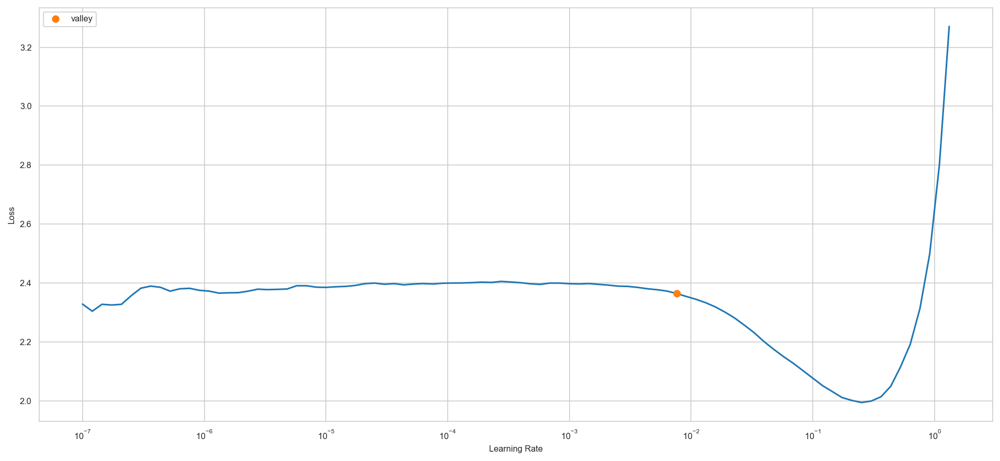

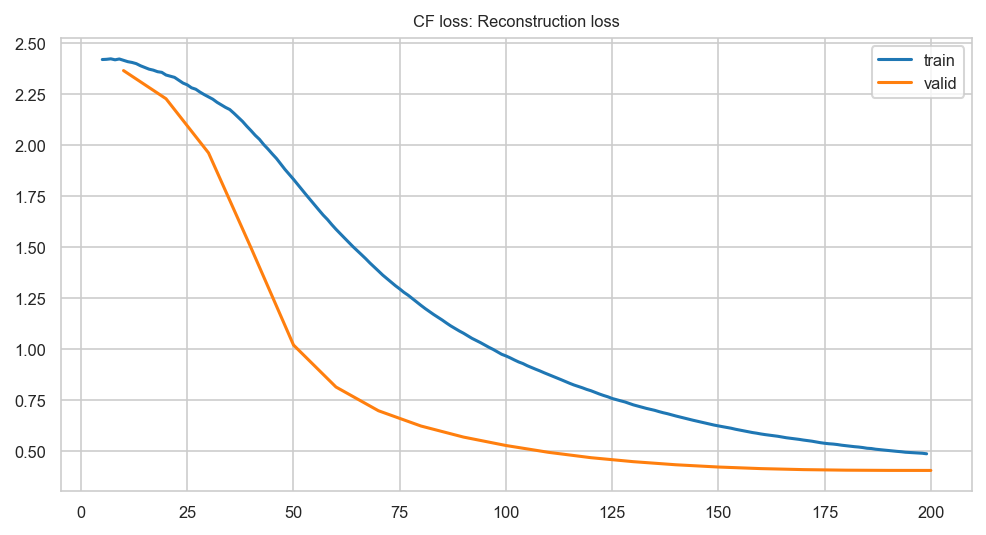

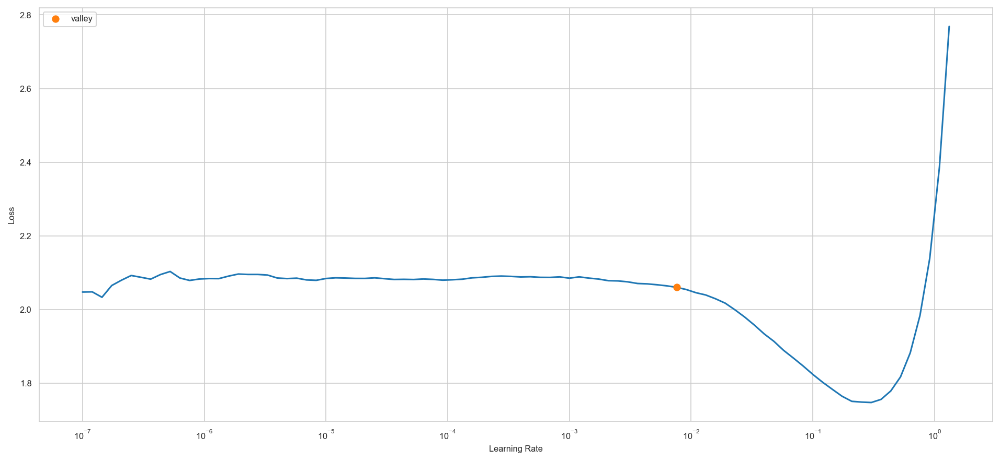

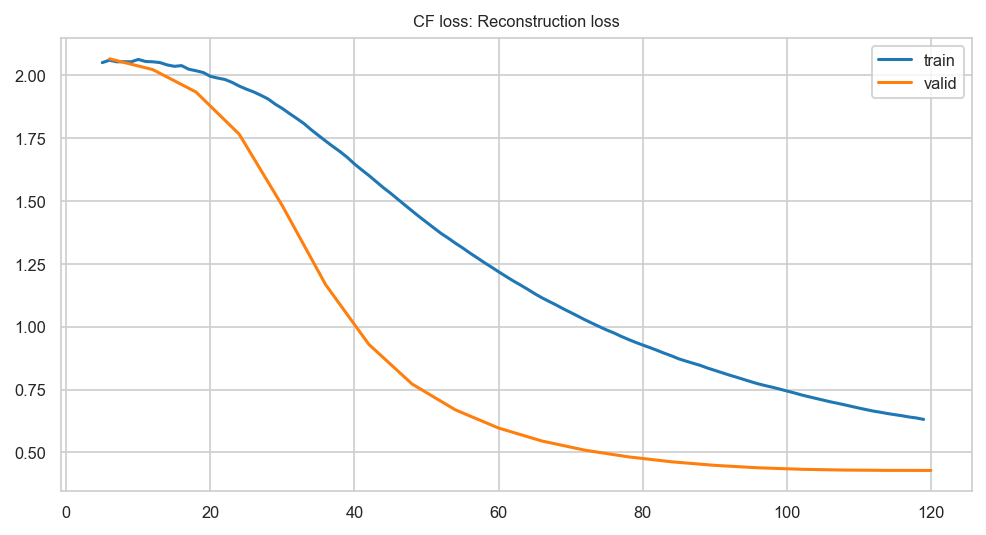

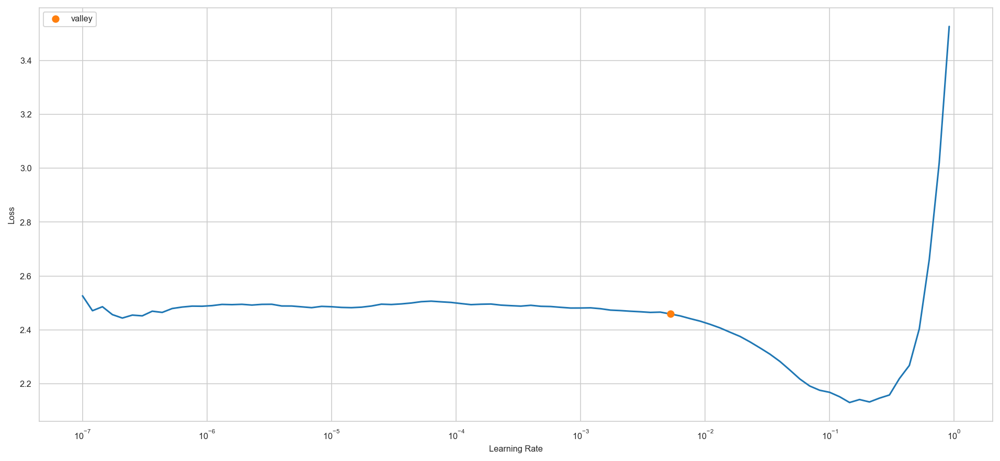

...

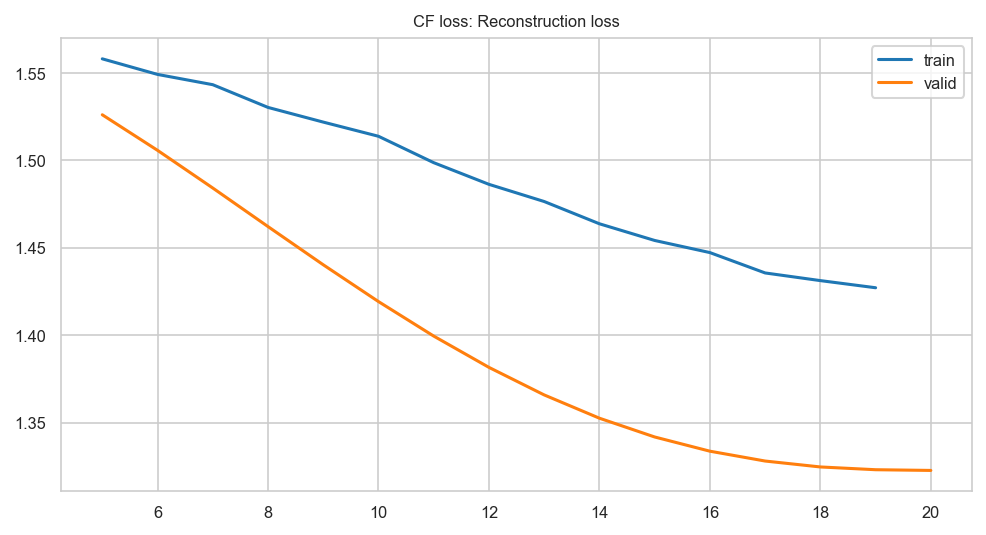

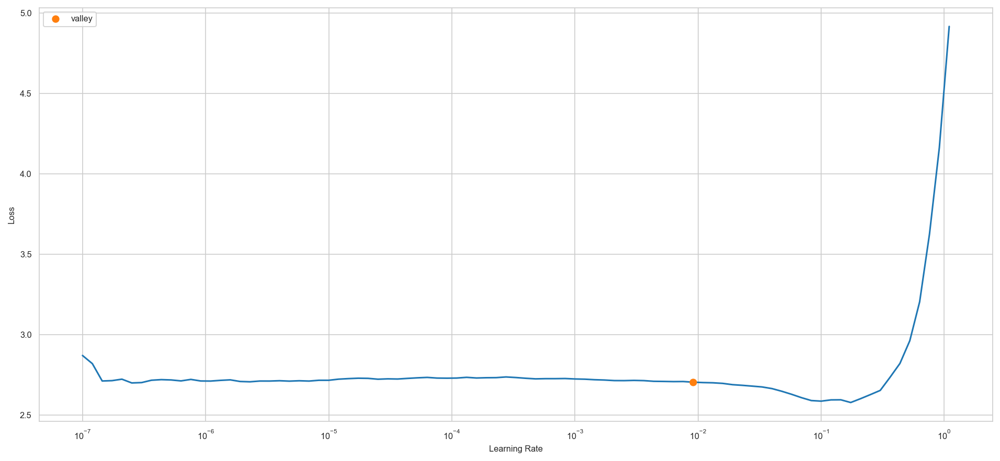

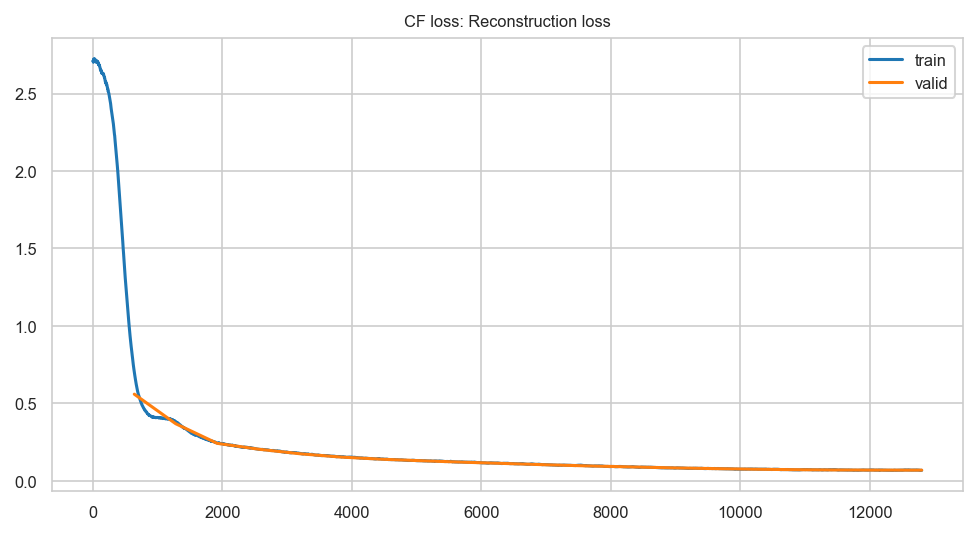

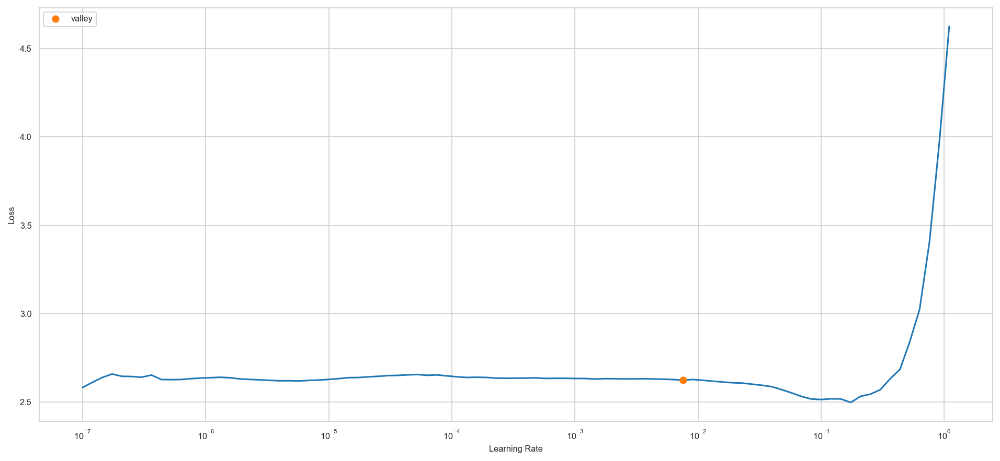

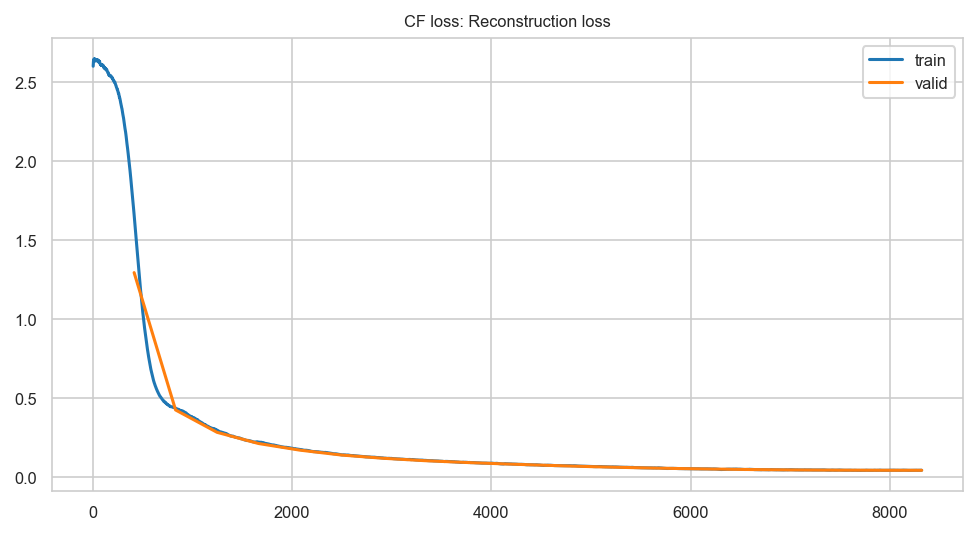

In [52]:
#hihm not suitable for cf
regions = ["himm", "hilm", "mihm", "mimm", "milm", "lihm", "limm", "whole"]
data_types = ["trs", "tes"]
data_files = {region + "_" + data_type + "_na": f"{region}_{data_type}_na.csv" for region in regions for data_type in data_types}

for region in regions:
    for data_type in data_types:
        file_key = f"{region}_{data_type}_na"
        file_name = data_files.get(file_key, f"{region}_{data_type}.csv")
        
        print(f"Processing {region}_{data_type}")
        print(f"Train_X shape: {splits.train_X.shape}")
        if hasattr(splits, 'val_y') and splits.val_y is not None:
            print(f"Val_Y shape: {splits.val_y.shape}")
        else:
            print(f"Warning: splits.val_y is missing for {region}_{data_type}")


        df = pd.read_csv(file_name, index_col=0)
        df.index.name = index_name  # already set
        df.columns.name = column_name  # not set due to csv disk file format

        if select_features:
        # potentially this can take a few iterations to stabilize.
            df = pimmslearn.filter.select_features(df, feat_prevalence=feat_prevalence)
            df = pimmslearn.filter.select_features(df=df, feat_prevalence=sample_completeness, axis=1)
        df.shape
        
        df = df.stack().to_frame('intensity')  # Convert to long format
        
        if sample_splits:
            splits, thresholds, fake_na_mcar, fake_na_mnar = pimmslearn.sampling.sample_mnar_mcar(
                df_long=df,
                frac_non_train=frac_non_train,
                frac_mnar=frac_mnar,
                random_state=random_state,
            )
            splits = pimmslearn.sampling.check_split_integrity(splits)
        else:
            splits = pimmslearn.sampling.DataSplits(is_wide_format=False)
            splits.train_X = df
            splits.val_y = df.copy()
        
        cf_model = CollaborativeFilteringTransformer(
            target_column='intensity',
            sample_column='Sample ID',
            item_column='protein group',
            out_folder=f'runs/scikit_interface/{region}_{data_type}'
        )
        
        # Check if train_X is empty
        if splits.train_X.empty:
            raise ValueError(f"Train dataset is empty for {region}_{data_type}. Check data processing!")

        # Debug data structure
        print(f"Train_X shape: {splits.train_X.shape}")
        print(splits.train_X.head())

        cf_model.fit(splits.train_X, splits.val_y, cuda=False, epochs_max=20)
        
        df_imputed = cf_model.transform(df).unstack()
        assert df_imputed.isna().sum().sum() == 0
        
        # Export data with transposed format
        df_imputed.T.to_csv(f'{region}_{data_type}_cf.csv', index=True)

## AutoEncoder architectures

## DAE

Processing hihm_trs
Train_X shape: (1705696, 1)
Val_Y shape: (1705696, 1)
Train_X shape: (1943, 1)
                                                                           intensity
Sample ID                                             protein group                 
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AEDAGEVR                19.362
                                                      AHSTMTGSGVDAR           14.214
                                                      AKGEVDVDVPK             17.749
                                                      DGHGIC[57.0215]VISR     15.611
                                                      DIWLSLGVPASR            17.558
(48, 267) (48, 267)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,454.210388,392.489227,00:00
1,446.768158,391.309174,00:00
2,445.248535,387.362549,00:00
3,437.041046,376.819611,00:00
4,427.570190,355.595703,00:00
5,413.237610,320.241119,00:00
6,394.178284,273.291473,00:00
7,374.865326,217.348648,00:00
8,353.030579,161.080276,00:00
9,330.825378,115.186226,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


Processing hihm_tes
Train_X shape: (1943, 1)
Val_Y shape: (1943, 1)
Train_X shape: (1872, 1)
                                                                           intensity
Sample ID                                             protein group                 
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AEDAGEVR                19.362
                                                      AHSTMTGSGVDAR           14.214
                                                      AKGEVDVDVPK             17.749
                                                      DGHGIC[57.0215]VISR     15.611
                                                      DIWLSLGVPASR            17.558
(48, 259) (48, 259)
Selected model: DAE


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,435.927490,378.456757,00:00
1,432.162628,377.780029,00:00
2,430.566376,375.108795,00:00
3,424.140015,367.973663,00:00
4,415.060822,352.965454,00:00
5,404.395294,327.044769,00:00
6,390.974457,290.563995,00:00
7,374.284271,248.820633,00:00
8,358.024750,202.059219,00:00
9,339.946106,164.996643,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing himm_trs
Train_X shape: (1872, 1)
Val_Y shape: (1872, 1)
Train_X shape: (41488, 1)
                                                                          intensity
Sample ID                                             protein group                
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAALQYPSPSAAQDMVER     14.917
                                                      AAEDSPYWVSPAYSK        15.569
                                                      AAFNSGK                19.447
                                                      AALEAVGGTVVLE          16.344
                                                      AALQMQFNAAER           16.002
(48, 1594) (48, 1594)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,9703.944336,8370.261719,00:00
1,9599.375000,8331.760742,00:00
2,9472.449219,8232.640625,00:00
3,9298.182617,7993.017090,00:00
4,9105.219727,7501.575684,00:00
5,8828.172852,6640.930176,00:00
6,8481.848633,5715.560059,00:00
7,8084.658203,4999.531738,00:00
8,7666.030762,4363.825684,00:00
9,7274.060547,3823.428467,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing himm_tes
Train_X shape: (41488, 1)
Val_Y shape: (41488, 1)
Train_X shape: (25508, 1)
                                                                                intensity
Sample ID                                             protein group                      
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAFNSGK                      21.038
                                                      AALEAVGGTVVLE                15.635
                                                      AALQMQFNAAER                 15.825
                                                      AAQLC[57.0215]GAGMAAVVDK     15.949
                                                      AAQNSGEAEYIEK                17.043
(32, 1594) (32, 1594)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,7412.178223,7547.132812,00:00
1,7244.780273,7457.263672,00:00
2,7084.187988,7240.252441,00:00
3,6876.816895,6698.672852,00:00
4,6615.766602,5601.361816,00:00
5,6287.493652,4370.544434,00:00
6,5893.683594,3521.607910,00:00
7,5511.759277,3028.840576,00:00
8,5124.612305,2498.535645,00:00
9,4763.612793,2624.971191,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing hilm_trs
Train_X shape: (25508, 1)
Val_Y shape: (25508, 1)
Train_X shape: (1095436, 1)
                                                                                     intensity
Sample ID                                             protein group                           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAAAAAPAAAATAPTTAATTAATAAQ     18.013
                                                      AAAAAWEEPSSGNGTAR                 16.855
                                                      AAAASAAEAGIATTGTEDSDDALLK         17.354
                                                      AAAEAAAEAK                        16.482
                                                      AAAEGLMSLLR                       15.602
(48, 25704) (48, 25704)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,250562.796875,243111.484375,00:00
1,236450.328125,193490.390625,00:00
2,217292.812500,147765.906250,00:00
3,197510.890625,185529.171875,00:00
4,183182.671875,215908.312500,00:00
5,174138.546875,143098.390625,00:00
6,165255.765625,129208.437500,00:00
7,155650.421875,102227.375000,00:00
8,149754.937500,95083.382812,00:00
9,143667.625000,118424.273438,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing hilm_tes
Train_X shape: (1095436, 1)
Val_Y shape: (1095436, 1)
Train_X shape: (727352, 1)
                                                                                     intensity
Sample ID                                             protein group                           
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAAAAAPAAAATAPTTAATTAATAAQ     17.865
                                                      AAAAAAAK                          16.109
                                                      AAAAAAALQAK                       18.724
                                                      AAAAAWEEPSSGNGTAR                 16.769
                                                      AAAASAAEAGIATTGTEDSDDALLK         17.175
(32, 25704) (32, 25704)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,209803.187500,228272.593750,00:00
1,207633.453125,238296.000000,00:00
2,204636.937500,232083.453125,00:00
3,201241.343750,224004.265625,00:00
4,195460.859375,187745.093750,00:00
5,187333.609375,151301.000000,00:00
6,177921.031250,138984.203125,00:00
7,168155.093750,118526.507812,00:00
8,158904.734375,116935.875000,00:00
9,149977.375000,104873.742188,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing mihm_trs
Train_X shape: (727352, 1)
Val_Y shape: (727352, 1)
Train_X shape: (85970, 1)
                                                                     intensity
Sample ID                                             protein group           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAPGNGR         14.925
                                                      AAAEPSPR           9.791
                                                      AADMLSGPR         13.081
                                                      AAEDLFVNIR        14.994
                                                      AAELQAQWER        14.230
(48, 11844) (48, 11844)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,20069.705078,17333.865234,00:00
1,19725.451172,17239.900391,00:00
2,19412.685547,17029.769531,00:00
3,18996.820312,16474.564453,00:00
4,18460.570312,14974.605469,00:00
5,17788.957031,12502.969727,00:00
6,16956.091797,9772.501953,00:00
7,16005.157227,7556.619141,00:00
8,14963.325195,5944.605957,00:00
9,13841.985352,4638.026367,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing mihm_tes
Train_X shape: (85970, 1)
Val_Y shape: (85970, 1)
Train_X shape: (83775, 1)
                                                                     intensity
Sample ID                                             protein group           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAPGNGR         14.925
                                                      AAAEPSPR           9.791
                                                      AADMLSGPR         13.081
                                                      AAEDLFVNIR        14.994
                                                      AAELQAQWER        14.230
(48, 11528) (48, 11528)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,19582.830078,16904.714844,00:00
1,19352.720703,16834.505859,00:00
2,19043.978516,16716.179688,00:00
3,18734.343750,16460.763672,00:00
4,18334.027344,15706.726562,00:00
5,17848.984375,14117.195312,00:00
6,17245.158203,11898.811523,00:00
7,16486.322266,9620.974609,00:00
8,15629.891602,7669.312500,00:00
9,14706.570312,6279.259277,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing mimm_trs
Train_X shape: (83775, 1)
Val_Y shape: (83775, 1)
Train_X shape: (527951, 1)
                                                                                                                      intensity
Sample ID                                             protein group                                                            
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAATAPPSPGPAQPGPR                                               13.784
                                                      AAAAADLANR                                                         14.576
                                                      AAAAASAAGPGGLVAGKEEK                                               14.113
                                                      AAAAC[57.0215]LDK                                                  15.133
                                                      AAAATGGTGPGAGIGAATGTGGSSEPSAC[57.0215]SDHPIPGC[57.0215]SLKEEEK     13.119
(48, 23

d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,122463.773438,108224.593750,00:00
1,120145.320312,111008.835938,00:00
2,117217.468750,106409.664062,00:00
3,113108.015625,92356.375000,00:00
4,107628.742188,79396.820312,00:00
5,101854.156250,72093.164062,00:00
6,96366.515625,66818.554688,00:00
7,90909.273438,55332.300781,00:00
8,86380.640625,49496.687500,00:00
9,81799.804688,43735.890625,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing mimm_tes
Train_X shape: (527951, 1)
Val_Y shape: (527951, 1)
Train_X shape: (328431, 1)
                                                                                                                      intensity
Sample ID                                             protein group                                                            
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAATAPPSPGPAQPGPR                                               13.683
                                                      AAAAADLANR                                                         14.706
                                                      AAAAASAAGPGGLVAGKEEK                                               13.383
                                                      AAAAC[57.0215]LDK                                                  16.398
                                                      AAAATGGTGPGAGIGAATGTGGSSEPSAC[57.0215]SDHPIPGC[57.0215]SLKEEEK     13.341
(32, 

d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,94779.398438,99817.796875,00:00
1,93539.578125,104538.632812,00:00
2,91446.523438,98601.218750,00:00
3,88185.273438,82679.054688,00:00
4,84820.289062,68337.367188,00:00
5,80088.656250,62509.351562,00:00
6,75389.898438,60628.960938,00:00
7,70529.921875,51957.296875,00:00
8,66226.085938,43535.539062,00:00
9,62457.750000,38810.242188,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing milm_trs
Train_X shape: (328431, 1)
Val_Y shape: (328431, 1)
Train_X shape: (779938, 1)
                                                                                 intensity
Sample ID                                             protein group                       
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAAAAAK                    13.791
                                                      AAAAAAAAVPSAGPAGPAPTSAAGR     14.652
                                                      AAAAALSQQQSLQER               14.626
                                                      AAAAPFQTSQASASAPR             14.940
                                                      AAAASVPNADGLK                 14.022
(48, 19234) (48, 19234)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,181409.109375,158845.125000,00:00
1,179078.093750,163687.484375,00:00
2,176126.703125,162123.265625,00:00
3,171632.156250,148107.390625,00:00
4,165560.500000,126748.742188,00:00
5,158043.375000,108864.726562,00:00
6,151209.968750,105162.273438,00:00
7,143464.796875,93840.406250,00:00
8,137546.000000,84675.320312,00:00
9,131520.031250,77623.125000,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing milm_tes
Train_X shape: (779938, 1)
Val_Y shape: (779938, 1)
Train_X shape: (512879, 1)
                                                                                 intensity
Sample ID                                             protein group                       
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAAAAAK                    15.224
                                                      AAAAAAAAVPSAGPAGPAPTSAAGR     14.665
                                                      AAAAALSQQQSLQER               14.482
                                                      AAAAPFQTSQASASAPR             14.769
                                                      AAAASVPNADGLK                 14.445
(32, 19234) (32, 19234)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,147708.203125,172199.750000,00:00
1,143004.203125,160078.468750,00:00
2,137013.515625,131155.656250,00:00
3,129275.617188,132047.859375,00:00
4,122125.742188,181797.843750,00:00
5,114816.398438,135765.484375,00:00
6,110176.031250,129033.562500,00:00
7,103857.218750,91377.117188,00:00
8,99159.187500,84513.320312,00:00
9,94112.812500,90289.156250,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing lihm_trs
Train_X shape: (512879, 1)
Val_Y shape: (512879, 1)
Train_X shape: (83133, 1)
                                                                                  intensity
Sample ID                                             protein group                        
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AADDSKEVESFQQLLNAR             12.240
                                                      AADISLDNLVEGKR                 12.650
                                                      AAEALHGEADSSGVLAAVDATVNK       11.247
                                                      AAELTATQVEEEEEEEDFR            12.012
                                                      AAHTEDINAC[57.0215]TLTTSPR     12.304
(48, 19918) (48, 19918)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,18770.607422,16120.610352,00:00
1,18557.783203,16060.901367,00:00
2,18296.001953,15935.198242,00:00
3,18027.111328,15745.405273,00:00
4,17700.734375,15308.932617,00:00
5,17305.017578,14284.752930,00:00
6,16794.458984,12564.461914,00:00
7,16172.341797,10566.632812,00:00
8,15456.311523,8518.352539,00:00
9,14646.319336,6689.210938,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing lihm_tes
Train_X shape: (83133, 1)
Val_Y shape: (83133, 1)
Train_X shape: (72157, 1)
                                                                                intensity
Sample ID                                             protein group                      
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AADDSKEVESFQQLLNAR           12.240
                                                      AADISLDNLVEGKR               12.650
                                                      AAEALHGEADSSGVLAAVDATVNK     11.247
                                                      AAELTATQVEEEEEEEDFR          12.012
                                                      AAIWESQHEGPEGAR              12.384
(48, 17282) (48, 17282)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,16285.298828,13990.132812,00:00
1,16076.552734,13940.489258,00:00
2,15853.384766,13833.424805,00:00
3,15615.745117,13637.671875,00:00
4,15340.166016,13226.208008,00:00
5,14990.396484,12349.950195,00:00
6,14549.194336,10889.168945,00:00
7,14026.622070,9132.393555,00:00
8,13404.459961,7384.119141,00:00
9,12722.354492,5822.268066,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing limm_trs
Train_X shape: (72157, 1)
Val_Y shape: (72157, 1)
Train_X shape: (8348, 1)
                                                                                             intensity
Sample ID                                             protein group                                   
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAIDAVDNKK                                12.489
                                                      AALEAQNALHNM[15.9949]K                    11.971
                                                      ADAINSTQSTALHVAVQR                        10.769
                                                      ADC[57.0215]TITM[15.9949]ADSDFLALMTGK     11.552
                                                      ADQDSEAM[15.9949]KR                       12.024
(48, 577) (48, 577)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1946.237793,1684.441284,00:00
1,1929.479614,1679.837524,00:00
2,1918.747070,1666.507446,00:00
3,1892.452148,1634.264160,00:00
4,1864.230835,1570.798462,00:00
5,1813.644775,1468.546387,00:00
6,1760.907959,1320.410034,00:00
7,1695.969360,1143.167725,00:00
8,1623.556519,953.295593,00:00
9,1545.322266,789.832458,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


Processing limm_tes
Train_X shape: (8348, 1)
Val_Y shape: (8348, 1)
Train_X shape: (4852, 1)
                                                                                             intensity
Sample ID                                             protein group                                   
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AALEAQNALHNM[15.9949]K                    11.611
                                                      ADAINSTQSTALHVAVQR                        10.481
                                                      ADC[57.0215]TITM[15.9949]ADSDFLALMTGK     12.663
                                                      ADQDSEAM[15.9949]KR                       12.728
                                                      AEKPDATADAEPDANQK                         12.928
(32, 577) (32, 577)
Selected model: DAE


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1394.534302,1440.387939,00:00
1,1371.795654,1426.266479,00:00
2,1346.782715,1391.878662,00:00
3,1303.526855,1317.893066,00:00
4,1252.906128,1170.568481,00:00
5,1189.668457,931.356689,00:00
6,1123.610962,695.793823,00:00
7,1049.846802,491.372894,00:00
8,969.471008,406.584625,00:00
9,893.946594,368.159637,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing whole_trs
Train_X shape: (4852, 1)
Val_Y shape: (4852, 1)
Train_X shape: (2624207, 1)
                                                                           intensity
Sample ID                                             protein group                 
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AEDAGEVR                19.362
                                                      AHSTMTGSGVDAR           14.214
                                                      AKGEVDVDVPK             17.749
                                                      DGHGIC[57.0215]VISR     15.611
                                                      DIWLSLGVPASR            17.558
(48, 103095) (48, 103095)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,605094.875000,644001.562500,00:01
1,592292.375000,563343.187500,00:01
2,571600.375000,489327.656250,00:01
3,543313.437500,396198.968750,00:01
4,509767.968750,360393.375000,00:01
5,478465.781250,416406.250000,00:01
6,454222.593750,354039.031250,00:01
7,430718.093750,270131.406250,00:01
8,414086.625000,265921.937500,00:01
9,395564.031250,236680.875000,00:01


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing whole_tes
Train_X shape: (2624207, 1)
Val_Y shape: (2624207, 1)
Train_X shape: (1705696, 1)
                                                                                  intensity
Sample ID                                             protein group                        
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity DIWLSLGVPASR                   18.812
                                                      DKDQMLQEK                      22.790
                                                      DTPSGISK                       19.429
                                                      DVVSRTGHSLALGC[57.0215]LHR     18.839
                                                      ELPEYYELIR                     16.522
(32, 101145) (32, 101145)
Selected model: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,491311.343750,665076.937500,00:01
1,481808.468750,563952.937500,00:01
2,467602.281250,483274.937500,00:01
3,445598.125000,386888.093750,00:01
4,420602.125000,371691.343750,00:01
5,395225.531250,457341.531250,00:01
6,371958.750000,378775.031250,00:01
7,351151.937500,299965.687500,00:01
8,332940.406250,234632.968750,00:01
9,319105.531250,240708.343750,00:01


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\3012899676.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

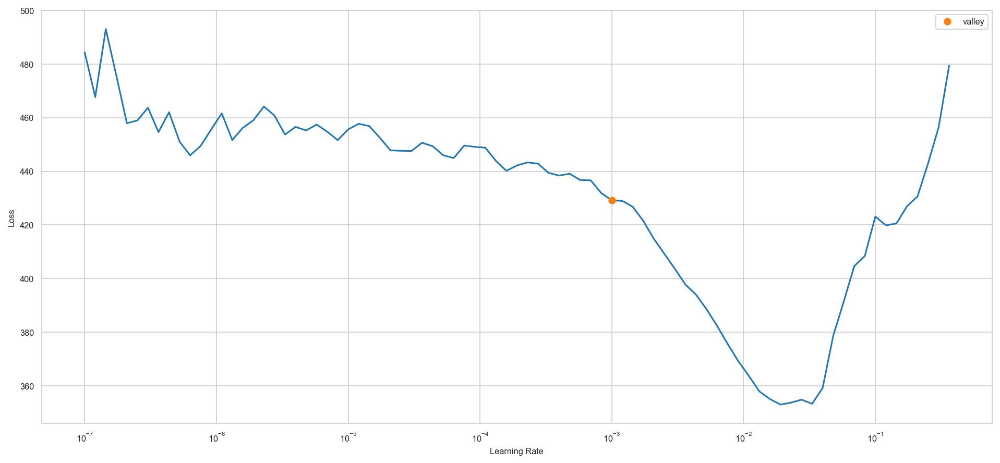

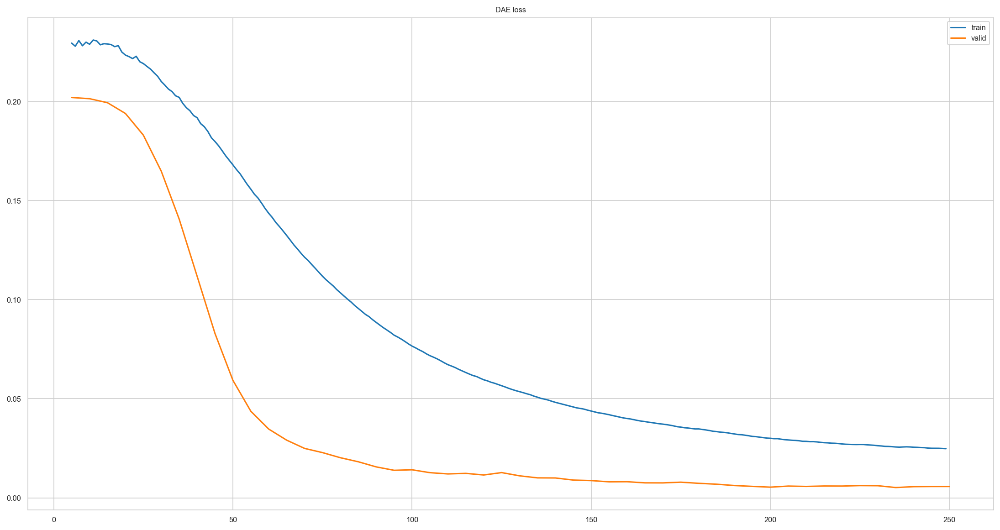

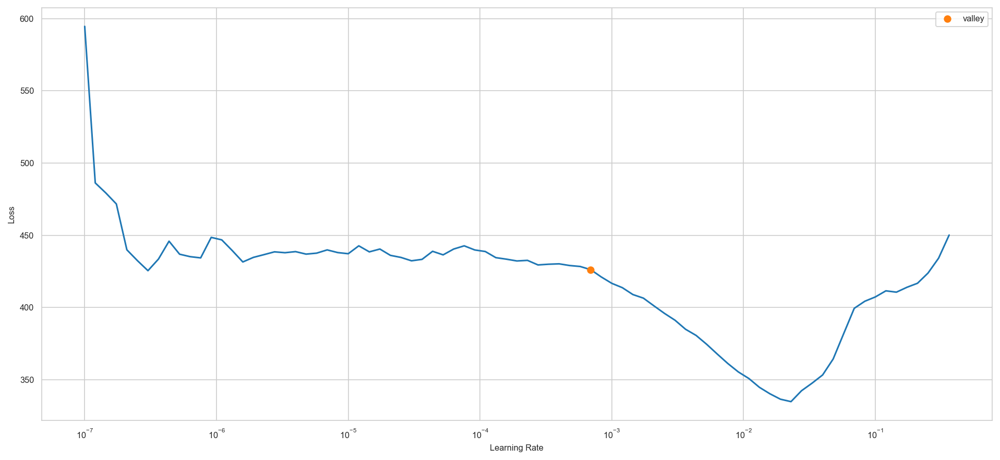

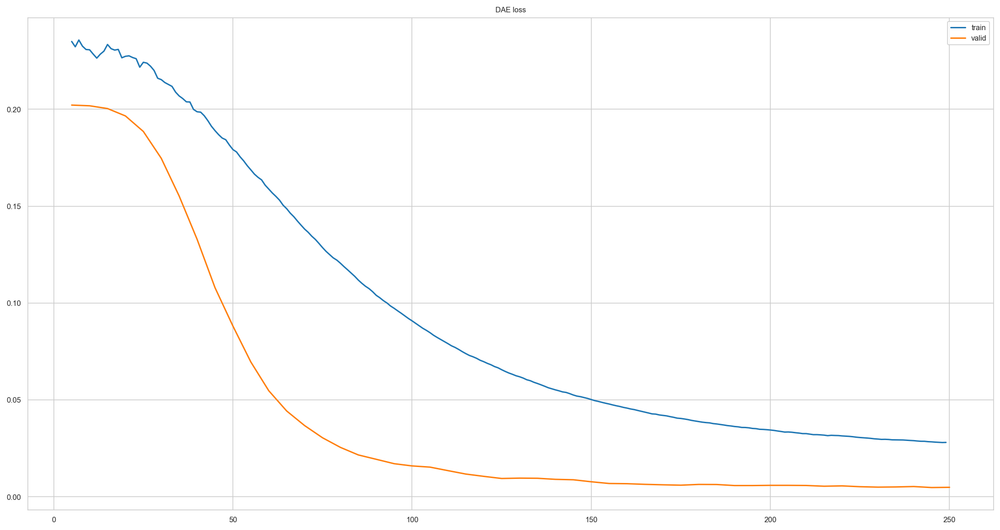

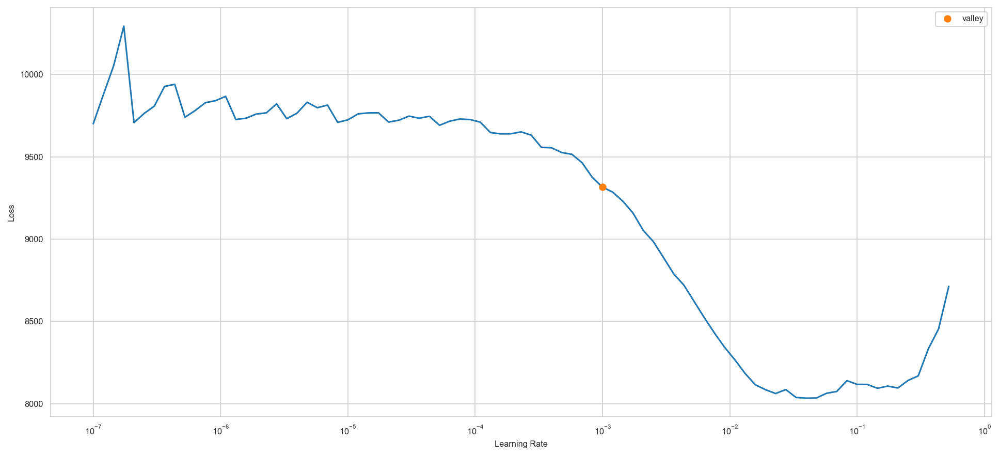

...

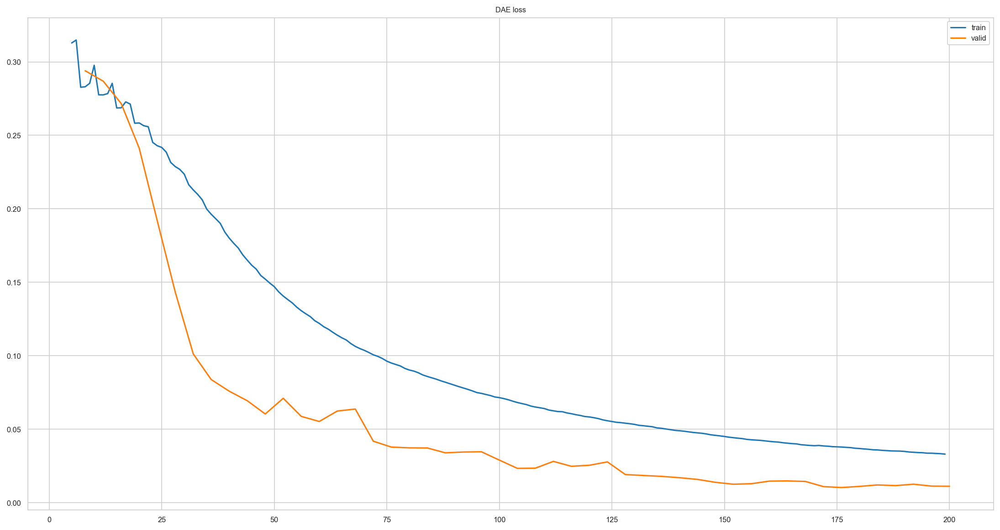

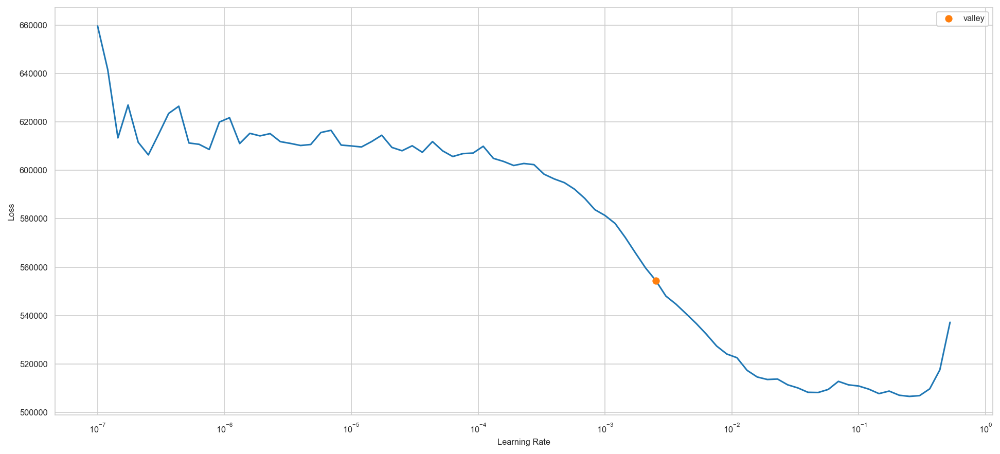

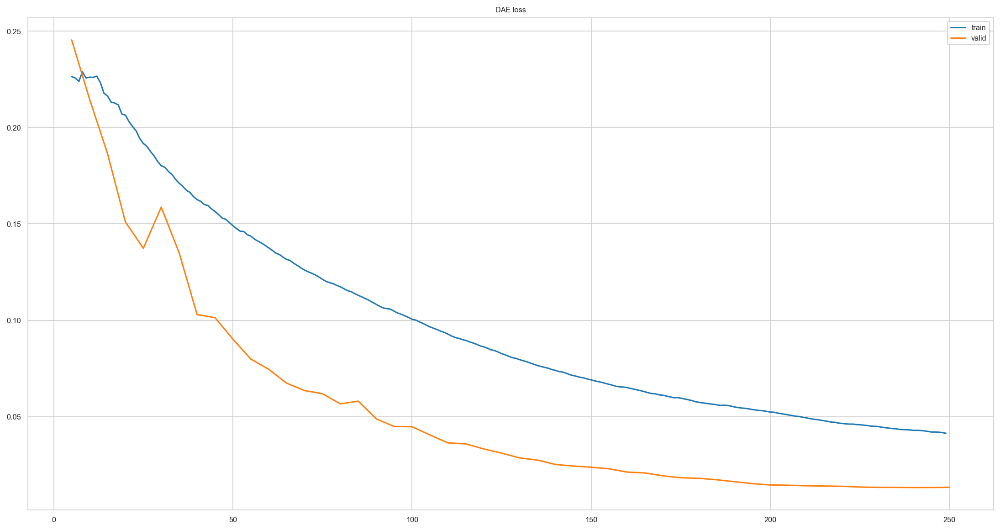

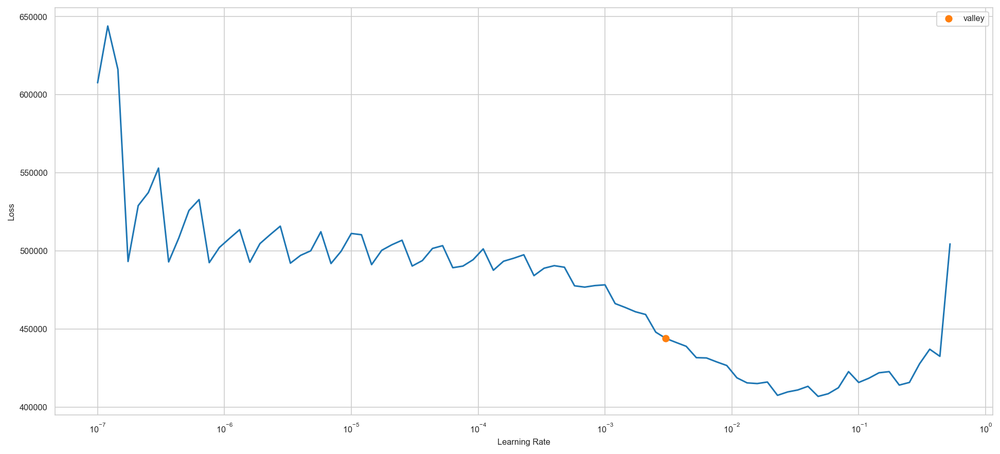

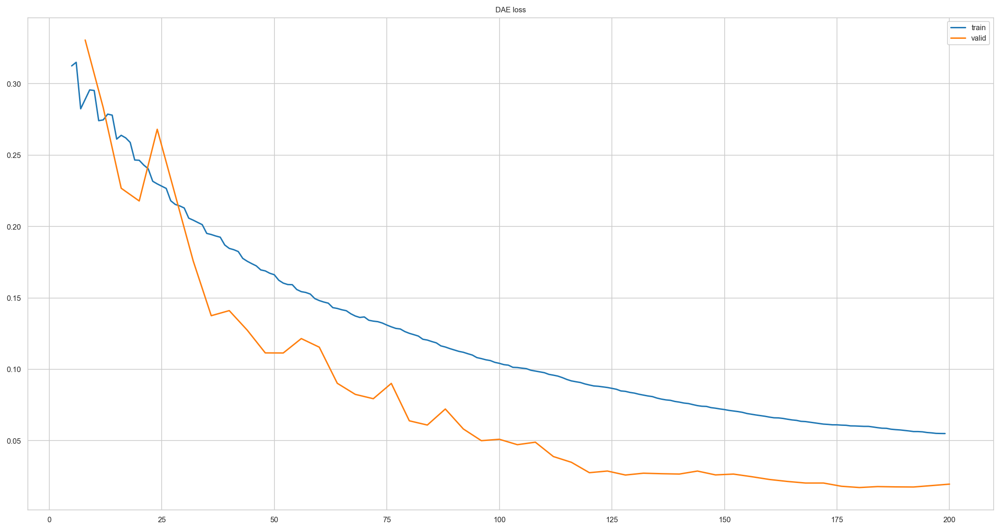

In [53]:
regions = ["hihm","himm", "hilm", "mihm", "mimm", "milm", "lihm", "limm", "whole"]
data_types = ["trs", "tes"]
data_files = {region + "_" + data_type + "_na": f"{region}_{data_type}_na.csv" for region in regions for data_type in data_types}

for region in regions:
    for data_type in data_types:
        file_key = f"{region}_{data_type}_na"
        file_name = data_files.get(file_key, f"{region}_{data_type}.csv")
        
        print(f"Processing {region}_{data_type}")
        print(f"Train_X shape: {splits.train_X.shape}")
        if hasattr(splits, 'val_y') and splits.val_y is not None:
            print(f"Val_Y shape: {splits.val_y.shape}")
        else:
            print(f"Warning: splits.val_y is missing for {region}_{data_type}")


        df = pd.read_csv(file_name, index_col=0)
        df.index.name = index_name  # already set
        df.columns.name = column_name  # not set due to csv disk file format

        if select_features:
        # potentially this can take a few iterations to stabilize.
            df = pimmslearn.filter.select_features(df, feat_prevalence=feat_prevalence)
            df = pimmslearn.filter.select_features(df=df, feat_prevalence=sample_completeness, axis=1)
        df.shape
        
        df = df.stack().to_frame('intensity')  # Convert to long format
        
        if sample_splits:
            splits, thresholds, fake_na_mcar, fake_na_mnar = pimmslearn.sampling.sample_mnar_mcar(
                df_long=df,
                frac_non_train=frac_non_train,
                frac_mnar=frac_mnar,
                random_state=random_state,
            )
            splits = pimmslearn.sampling.check_split_integrity(splits)
        else:
            splits = pimmslearn.sampling.DataSplits(is_wide_format=False)
            splits.train_X = df
            splits.val_y = df.copy()
        
        # Check if train_X is empty
        if splits.train_X.empty:
            raise ValueError(f"Train dataset is empty for {region}_{data_type}. Check data processing!")

        # Debug data structure
        print(f"Train_X shape: {splits.train_X.shape}")
        print(splits.train_X.head())

        # Use wide format of data
        splits.to_wide_format()
        splits.train_X

        if splits.val_y is not None:
            splits.val_y = pd.DataFrame(pd.NA, index=splits.train_X.index,
                                columns=splits.train_X.columns).fillna(splits.val_y)

            print(splits.train_X.shape, splits.val_y.shape)
        
        print("Selected model: DAE")
        model = AETransformer(
            model='DAE',
            hidden_layers=[512,],
            latent_dim=50,
            out_folder='runs/scikit_interface',
            batch_size=10,
        )
        
        model.fit(splits.train_X, splits.val_y,
          epochs_max=50,
          cuda=False)
        
        df_imputed = model.transform(splits.train_X).stack()

        splits.to_long_format()
        df_imputed = df_imputed.replace(splits.val_y).replace(splits.test_y)
        df_imputed

        #export data
        df_imputed = df_imputed.unstack()  # back to wide-format
        df_imputed.T.to_csv(f'{region}_{data_type}_dae.csv', index=True)

## VAE

Processing hihm_trs
Train_X shape: (1705696, 1)
Val_Y shape: (1705696, 1)
Train_X shape: (1943, 1)
                                                                           intensity
Sample ID                                             protein group                 
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AEDAGEVR                19.362
                                                      AHSTMTGSGVDAR           14.214
                                                      AKGEVDVDVPK             17.749
                                                      DGHGIC[57.0215]VISR     15.611
                                                      DIWLSLGVPASR            17.558
(48, 267) (48, 267)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,70.308548,63.344437,00:00
1,69.876740,63.951645,00:00
2,69.716232,64.082756,00:00
3,69.575310,64.178596,00:00
4,69.259056,64.296318,00:00
5,68.857826,64.001595,00:00
6,68.338577,63.558529,00:00
7,67.902992,62.953159,00:00
8,67.353508,62.925961,00:00
9,66.969704,62.029240,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


Processing hihm_tes
Train_X shape: (1943, 1)
Val_Y shape: (1943, 1)
Train_X shape: (1872, 1)
                                                                           intensity
Sample ID                                             protein group                 
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AEDAGEVR                19.362
                                                      AHSTMTGSGVDAR           14.214
                                                      AKGEVDVDVPK             17.749
                                                      DGHGIC[57.0215]VISR     15.611
                                                      DIWLSLGVPASR            17.558
(48, 259) (48, 259)
Selected model: VAE


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,67.823875,60.921474,00:00
1,67.883911,62.147141,00:00
2,67.338295,61.534718,00:00
3,67.108704,62.374146,00:00
4,66.927124,62.388554,00:00
5,66.599457,61.868420,00:00
6,66.063644,60.908810,00:00
7,65.695366,61.141174,00:00
8,65.191124,60.831039,00:00
9,64.723579,59.536083,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing himm_trs
Train_X shape: (1872, 1)
Val_Y shape: (1872, 1)
Train_X shape: (41488, 1)
                                                                          intensity
Sample ID                                             protein group                
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAALQYPSPSAAQDMVER     14.917
                                                      AAEDSPYWVSPAYSK        15.569
                                                      AAFNSGK                19.447
                                                      AALEAVGGTVVLE          16.344
                                                      AALQMQFNAAER           16.002
(48, 1594) (48, 1594)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1353.096924,1280.042480,00:00
1,1350.904297,1293.809082,00:00
2,1348.971313,1292.397583,00:00
3,1348.096680,1295.933228,00:00
4,1343.919189,1289.639282,00:00
5,1338.953613,1286.174561,00:00
6,1333.404907,1274.561890,00:00
7,1326.788086,1258.336792,00:00
8,1318.314331,1234.983276,00:00
9,1307.787964,1207.436768,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing himm_tes
Train_X shape: (41488, 1)
Val_Y shape: (41488, 1)
Train_X shape: (25508, 1)
                                                                                intensity
Sample ID                                             protein group                      
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAFNSGK                      21.038
                                                      AALEAVGGTVVLE                15.635
                                                      AALQMQFNAAER                 15.825
                                                      AAQLC[57.0215]GAGMAAVVDK     15.949
                                                      AAQNSGEAEYIEK                17.043
(32, 1594) (32, 1594)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,1200.069336,1175.722534,00:00
1,1203.911133,1179.453979,00:00
2,1233.060913,1183.573486,00:00
3,1215.894165,1183.916016,00:00
4,1212.489380,1181.532959,00:00
5,1219.861694,1174.230713,00:00
6,1218.255005,1158.143433,00:00
7,1211.193237,1140.104980,00:00
8,1197.068726,1105.915405,00:00
9,1193.708374,1067.372681,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing hilm_trs
Train_X shape: (25508, 1)
Val_Y shape: (25508, 1)
Train_X shape: (1095436, 1)
                                                                                     intensity
Sample ID                                             protein group                           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAAAAAPAAAATAPTTAATTAATAAQ     18.013
                                                      AAAAAWEEPSSGNGTAR                 16.855
                                                      AAAASAAEAGIATTGTEDSDDALLK         17.354
                                                      AAAEAAAEAK                        16.482
                                                      AAAEGLMSLLR                       15.602
(48, 25704) (48, 25704)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,35549.246094,33903.628906,00:00
1,35522.570312,34626.582031,00:00
2,35368.335938,34959.863281,00:00
3,35212.242188,34563.878906,00:00
4,35005.109375,33879.253906,00:00
5,34690.367188,32539.650391,00:00
6,34258.734375,30917.664062,00:00
7,33722.984375,29090.904297,00:00
8,33043.695312,27626.884766,00:00
9,32321.623047,26241.146484,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing hilm_tes
Train_X shape: (1095436, 1)
Val_Y shape: (1095436, 1)
Train_X shape: (727352, 1)
                                                                                     intensity
Sample ID                                             protein group                           
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAAAAAPAAAATAPTTAATTAATAAQ     17.865
                                                      AAAAAAAK                          16.109
                                                      AAAAAAALQAK                       18.724
                                                      AAAAAWEEPSSGNGTAR                 16.769
                                                      AAAASAAEAGIATTGTEDSDDALLK         17.175
(32, 25704) (32, 25704)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,34909.667969,33634.996094,00:00
1,34947.679688,34378.445312,00:00
2,34721.179688,34899.292969,00:00
3,34685.488281,34829.558594,00:00
4,34464.101562,34579.011719,00:00
5,34570.988281,33290.527344,00:00
6,34522.160156,32405.003906,00:00
7,34079.273438,31097.894531,00:00
8,34396.421875,29850.062500,00:00
9,33824.828125,28555.121094,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing mihm_trs
Train_X shape: (727352, 1)
Val_Y shape: (727352, 1)
Train_X shape: (85970, 1)
                                                                     intensity
Sample ID                                             protein group           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAPGNGR         14.925
                                                      AAAEPSPR           9.791
                                                      AADMLSGPR         13.081
                                                      AAEDLFVNIR        14.994
                                                      AAELQAQWER        14.230
(48, 11844) (48, 11844)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2819.282715,2642.185059,00:00
1,2789.202148,2657.523438,00:00
2,2771.851074,2657.332275,00:00
3,2756.263184,2658.265381,00:00
4,2735.353516,2612.480713,00:00
5,2710.841309,2519.902588,00:00
6,2679.112549,2398.420654,00:00
7,2643.930176,2246.762451,00:00
8,2584.412354,2095.731689,00:00
9,2517.010742,1948.392944,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing mihm_tes
Train_X shape: (85970, 1)
Val_Y shape: (85970, 1)
Train_X shape: (83775, 1)
                                                                     intensity
Sample ID                                             protein group           
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAPGNGR         14.925
                                                      AAAEPSPR           9.791
                                                      AADMLSGPR         13.081
                                                      AAEDLFVNIR        14.994
                                                      AAELQAQWER        14.230
(48, 11528) (48, 11528)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2727.696777,2565.332031,00:00
1,2719.612549,2578.054199,00:00
2,2717.038818,2587.684326,00:00
3,2701.371826,2586.341064,00:00
4,2682.760498,2551.156250,00:00
5,2661.698486,2458.658936,00:00
6,2625.809814,2334.189697,00:00
7,2581.005615,2190.911377,00:00
8,2522.602539,2028.085571,00:00
9,2452.377930,1864.911499,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing mimm_trs
Train_X shape: (83775, 1)
Val_Y shape: (83775, 1)
Train_X shape: (527951, 1)
                                                                                                                      intensity
Sample ID                                             protein group                                                            
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAATAPPSPGPAQPGPR                                               13.784
                                                      AAAAADLANR                                                         14.576
                                                      AAAAASAAGPGGLVAGKEEK                                               14.113
                                                      AAAAC[57.0215]LDK                                                  15.133
                                                      AAAATGGTGPGAGIGAATGTGGSSEPSAC[57.0215]SDHPIPGC[57.0215]SLKEEEK     13.119
(48, 23

d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,17148.507812,16272.667969,00:00
1,17094.248047,16431.287109,00:00
2,17012.519531,16667.722656,00:00
3,16973.626953,16811.410156,00:00
4,16906.669922,16574.248047,00:00
5,16830.761719,16190.890625,00:00
6,16710.187500,15770.203125,00:00
7,16548.986328,15099.676758,00:00
8,16333.961914,14392.163086,00:00
9,16076.950195,13659.598633,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing mimm_tes
Train_X shape: (527951, 1)
Val_Y shape: (527951, 1)
Train_X shape: (328431, 1)
                                                                                                                      intensity
Sample ID                                             protein group                                                            
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAATAPPSPGPAQPGPR                                               13.683
                                                      AAAAADLANR                                                         14.706
                                                      AAAAASAAGPGGLVAGKEEK                                               13.383
                                                      AAAAC[57.0215]LDK                                                  16.398
                                                      AAAATGGTGPGAGIGAATGTGGSSEPSAC[57.0215]SDHPIPGC[57.0215]SLKEEEK     13.341
(32, 

d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,16080.028320,15159.347656,00:00
1,15683.301758,15328.774414,00:00
2,15578.967773,15624.810547,00:00
3,15514.455078,15936.668945,00:00
4,15515.099609,15774.646484,00:00
5,15429.789062,15409.171875,00:00
6,15488.158203,15034.469727,00:00
7,15416.272461,14590.608398,00:00
8,15332.024414,14202.113281,00:00
9,15260.338867,13664.649414,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing milm_trs
Train_X shape: (328431, 1)
Val_Y shape: (328431, 1)
Train_X shape: (779938, 1)
                                                                                 intensity
Sample ID                                             protein group                       
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAAAAAAAAK                    13.791
                                                      AAAAAAAAVPSAGPAGPAPTSAAGR     14.652
                                                      AAAAALSQQQSLQER               14.626
                                                      AAAAPFQTSQASASAPR             14.940
                                                      AAAASVPNADGLK                 14.022
(48, 19234) (48, 19234)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,25273.445312,24051.304688,00:00
1,25255.423828,24366.541016,00:00
2,25200.302734,24741.197266,00:00
3,25110.972656,24747.382812,00:00
4,24994.626953,24416.228516,00:00
5,24836.277344,23768.380859,00:00
6,24627.320312,22970.970703,00:00
7,24342.445312,21871.437500,00:00
8,23977.873047,20825.283203,00:00
9,23564.785156,19842.650391,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing milm_tes
Train_X shape: (779938, 1)
Val_Y shape: (779938, 1)
Train_X shape: (512879, 1)
                                                                                 intensity
Sample ID                                             protein group                       
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AAAAAAAAAK                    15.224
                                                      AAAAAAAAVPSAGPAGPAPTSAAGR     14.665
                                                      AAAAALSQQQSLQER               14.482
                                                      AAAAPFQTSQASASAPR             14.769
                                                      AAAASVPNADGLK                 14.445
(32, 19234) (32, 19234)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,24937.941406,23812.507812,00:00
1,24728.994141,24243.960938,00:00
2,24635.169922,24758.386719,00:00
3,24584.634766,24425.132812,00:00
4,24509.585938,23946.294922,00:00
5,24605.652344,23253.847656,00:00
6,24634.644531,22527.351562,00:00
7,24262.675781,21732.462891,00:00
8,23896.955078,20732.605469,00:00
9,23710.162109,19904.060547,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing lihm_trs
Train_X shape: (512879, 1)
Val_Y shape: (512879, 1)
Train_X shape: (83133, 1)
                                                                                  intensity
Sample ID                                             protein group                        
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AADDSKEVESFQQLLNAR             12.240
                                                      AADISLDNLVEGKR                 12.650
                                                      AAEALHGEADSSGVLAAVDATVNK       11.247
                                                      AAELTATQVEEEEEEEDFR            12.012
                                                      AAHTEDINAC[57.0215]TLTTSPR     12.304
(48, 19918) (48, 19918)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2662.935059,2517.262695,00:00
1,2653.554199,2535.225342,00:00
2,2653.271973,2532.287109,00:00
3,2642.745361,2530.697510,00:00
4,2630.878906,2520.386475,00:00
5,2614.353271,2487.521729,00:00
6,2594.764404,2406.326416,00:00
7,2567.293457,2298.052734,00:00
8,2532.495605,2179.931396,00:00
9,2490.360107,2033.641602,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing lihm_tes
Train_X shape: (83133, 1)
Val_Y shape: (83133, 1)
Train_X shape: (72157, 1)
                                                                                intensity
Sample ID                                             protein group                      
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AADDSKEVESFQQLLNAR           12.240
                                                      AADISLDNLVEGKR               12.650
                                                      AAEALHGEADSSGVLAAVDATVNK     11.247
                                                      AAELTATQVEEEEEEEDFR          12.012
                                                      AAIWESQHEGPEGAR              12.384
(48, 17282) (48, 17282)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,2313.653076,2186.823486,00:00
1,2307.240723,2198.377930,00:00
2,2310.695312,2195.803467,00:00
3,2300.505859,2191.726318,00:00
4,2285.804443,2187.903076,00:00
5,2272.846680,2154.789307,00:00
6,2256.636719,2088.598877,00:00
7,2231.609131,1997.860474,00:00
8,2201.959961,1886.629028,00:00
9,2160.415039,1758.562134,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing limm_trs
Train_X shape: (72157, 1)
Val_Y shape: (72157, 1)
Train_X shape: (8348, 1)
                                                                                             intensity
Sample ID                                             protein group                                   
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AAIDAVDNKK                                12.489
                                                      AALEAQNALHNM[15.9949]K                    11.971
                                                      ADAINSTQSTALHVAVQR                        10.769
                                                      ADC[57.0215]TITM[15.9949]ADSDFLALMTGK     11.552
                                                      ADQDSEAM[15.9949]KR                       12.024
(48, 577) (48, 577)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,278.847687,259.216034,00:00
1,276.409698,260.504364,00:00
2,275.584869,260.851959,00:00
3,273.802887,259.476807,00:00
4,271.916565,255.403488,00:00
5,270.453339,251.845901,00:00
6,267.895691,247.680771,00:00
7,265.650635,243.115555,00:00
8,262.637665,231.194702,00:00
9,258.500244,222.424637,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing limm_tes
Train_X shape: (8348, 1)
Val_Y shape: (8348, 1)
Train_X shape: (4852, 1)
                                                                                             intensity
Sample ID                                             protein group                                   
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity AALEAQNALHNM[15.9949]K                    11.611
                                                      ADAINSTQSTALHVAVQR                        10.481
                                                      ADC[57.0215]TITM[15.9949]ADSDFLALMTGK     12.663
                                                      ADQDSEAM[15.9949]KR                       12.728
                                                      AEKPDATADAEPDANQK                         12.928
(32, 577) (32, 577)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,264.970978,227.397491,00:00
1,249.784409,226.311401,00:00
2,240.019073,226.520737,00:00
3,239.895538,226.250305,00:00
4,239.607468,226.869034,00:00
5,235.344070,223.193375,00:00
6,235.030106,222.417419,00:00
7,234.297836,218.762344,00:00
8,233.704041,215.547958,00:00
9,233.019257,210.994522,00:00


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing whole_trs
Train_X shape: (4852, 1)
Val_Y shape: (4852, 1)
Train_X shape: (2624207, 1)
                                                                           intensity
Sample ID                                             protein group                 
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity AEDAGEVR                19.362
                                                      AHSTMTGSGVDAR           14.214
                                                      AKGEVDVDVPK             17.749
                                                      DGHGIC[57.0215]VISR     15.611
                                                      DIWLSLGVPASR            17.558
(48, 103095) (48, 103095)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,85084.945312,82500.359375,00:03
1,84940.414062,84699.148438,00:03
2,84780.187500,85214.000000,00:03
3,84430.304688,84115.867188,00:03
4,84032.445312,82775.742188,00:03
5,83559.601562,80547.421875,00:03
6,82869.390625,77400.742188,00:03
7,81892.273438,74032.812500,00:03
8,80688.937500,69997.539062,00:03
9,79315.375000,66305.882812,00:03


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

Processing whole_tes
Train_X shape: (2624207, 1)
Val_Y shape: (2624207, 1)
Train_X shape: (1705696, 1)
                                                                                  intensity
Sample ID                                             protein group                        
Hela_100ng_10_15_2023_Slot1_90_11572.MaxLFQ.Intensity DIWLSLGVPASR                   18.812
                                                      DKDQMLQEK                      22.790
                                                      DTPSGISK                       19.429
                                                      DVVSRTGHSLALGC[57.0215]LHR     18.839
                                                      ELPEYYELIR                     16.522
(32, 101145) (32, 101145)
Selected model: VAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=device, **torch_load_kwarg

epoch,train_loss,valid_loss,time
0,82005.390625,80741.375000,00:02
1,82409.828125,84400.390625,00:02
2,83592.046875,86878.773438,00:02
3,82645.031250,85494.335938,00:02
4,82156.554688,81809.625000,00:03
5,81583.312500,80535.835938,00:03
6,80895.078125,78216.156250,00:03
7,80535.453125,76088.937500,00:03
8,79802.296875,73309.648438,00:03
9,79041.000000,70360.148438,00:03


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\vae_training


C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_155868\1177700612.py:74: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and wil

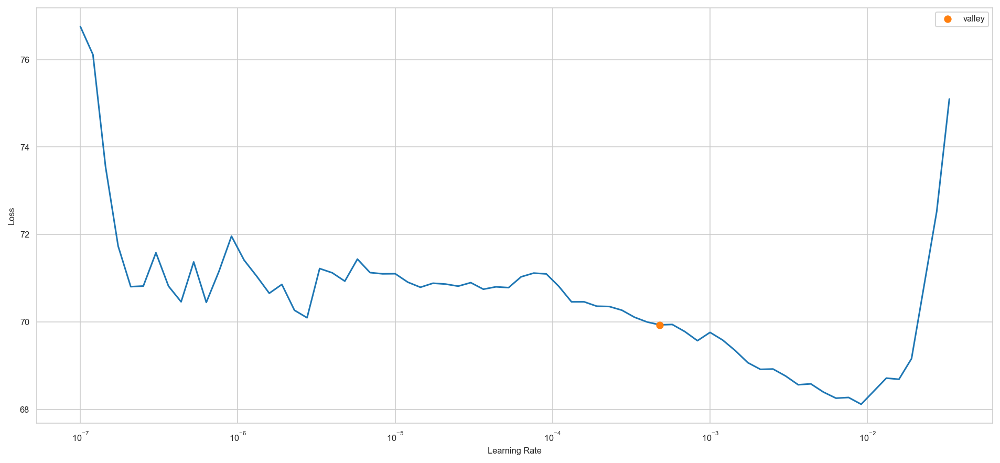

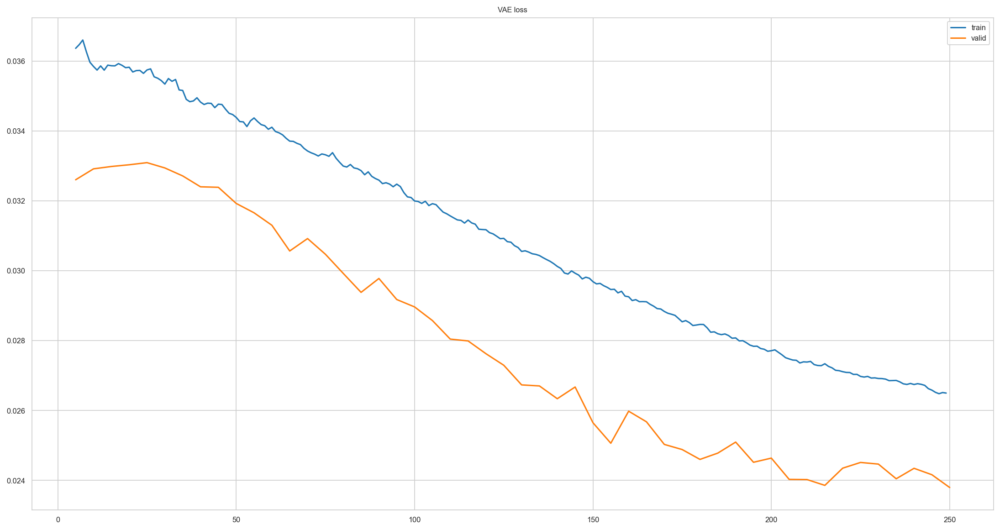

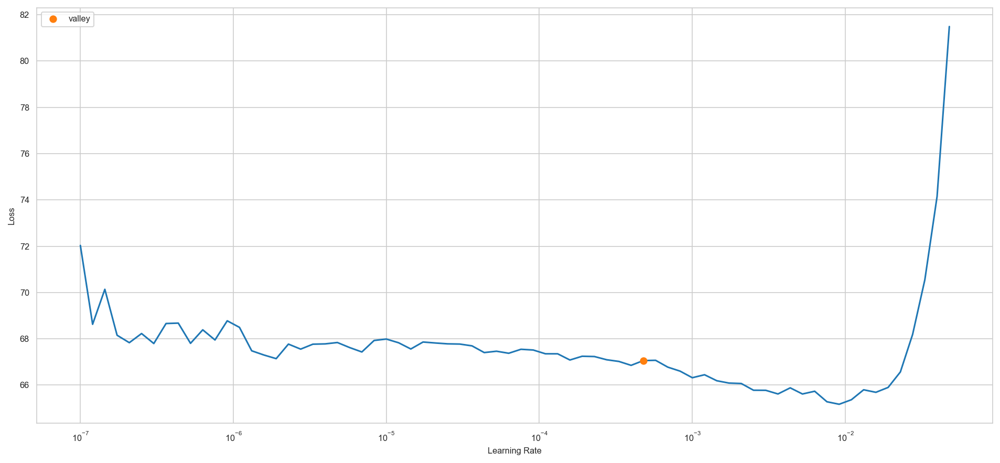

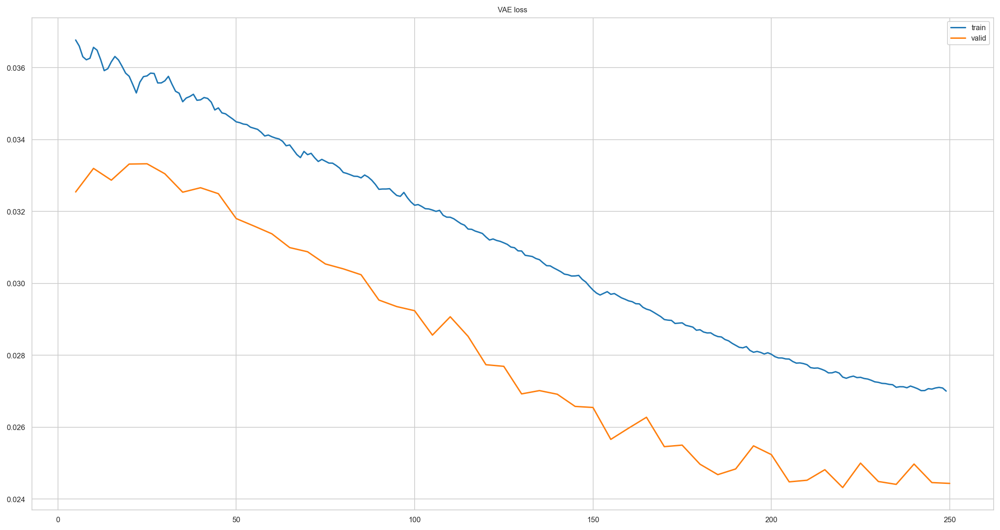

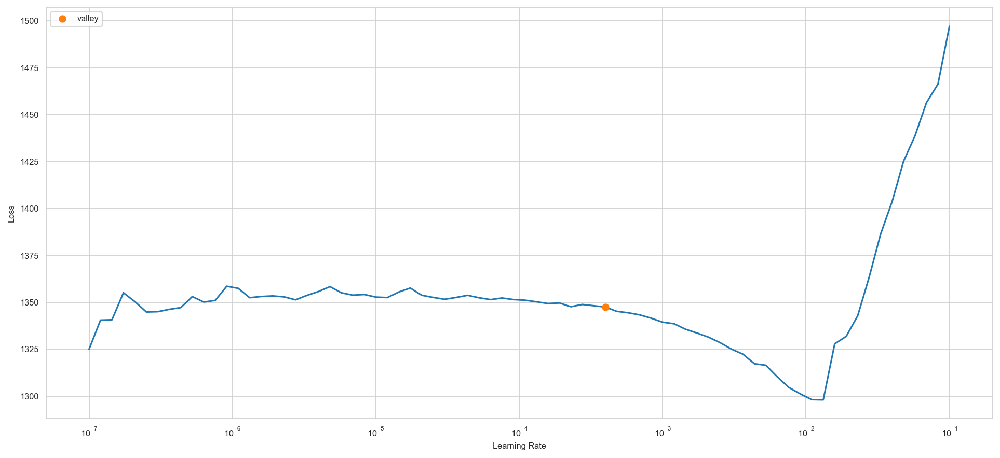

...

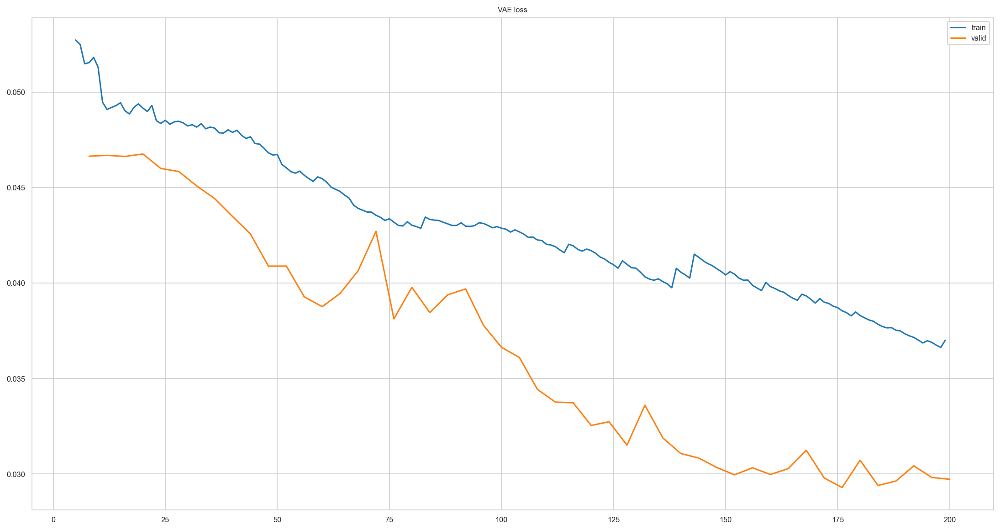

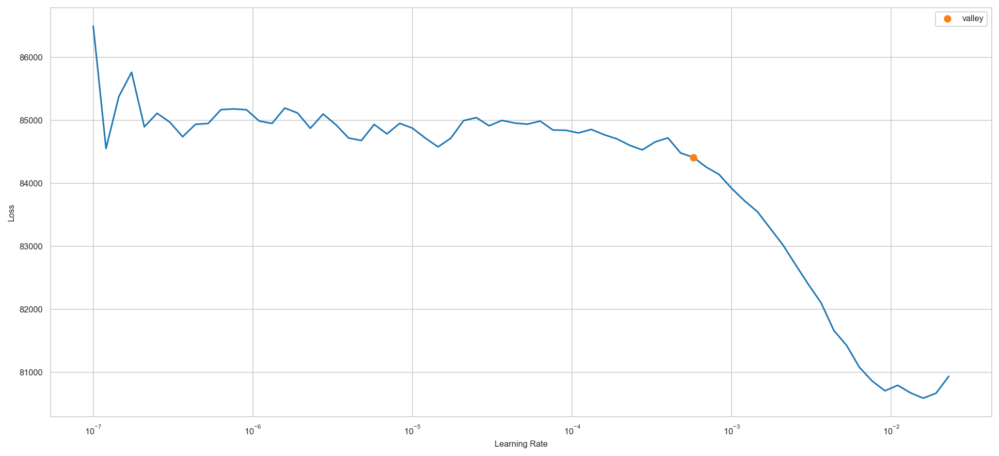

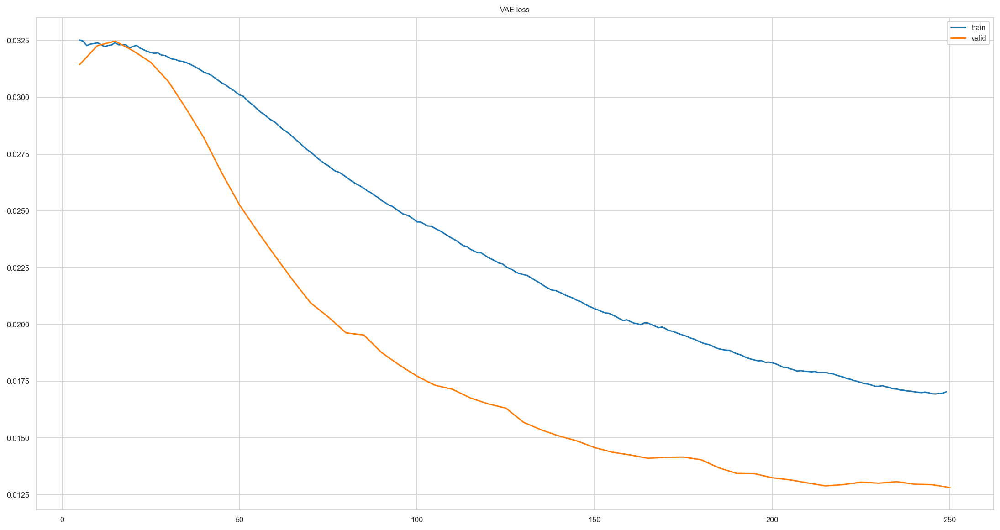

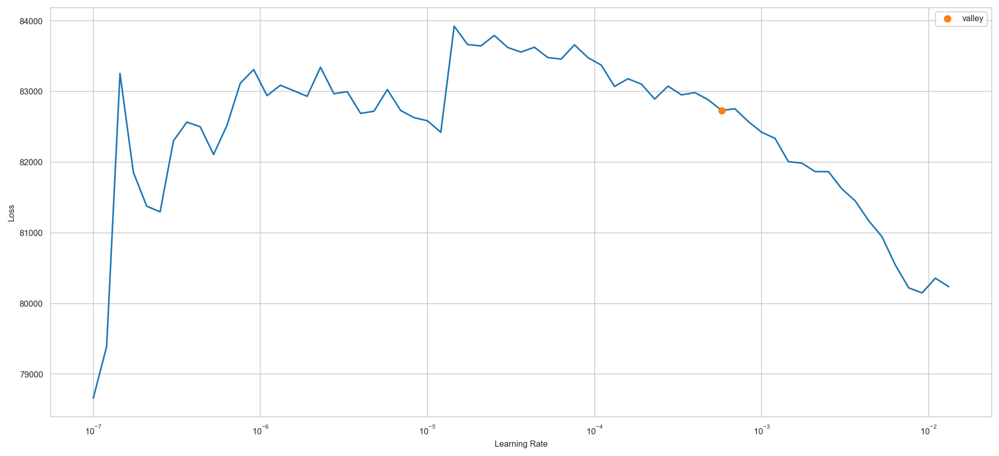

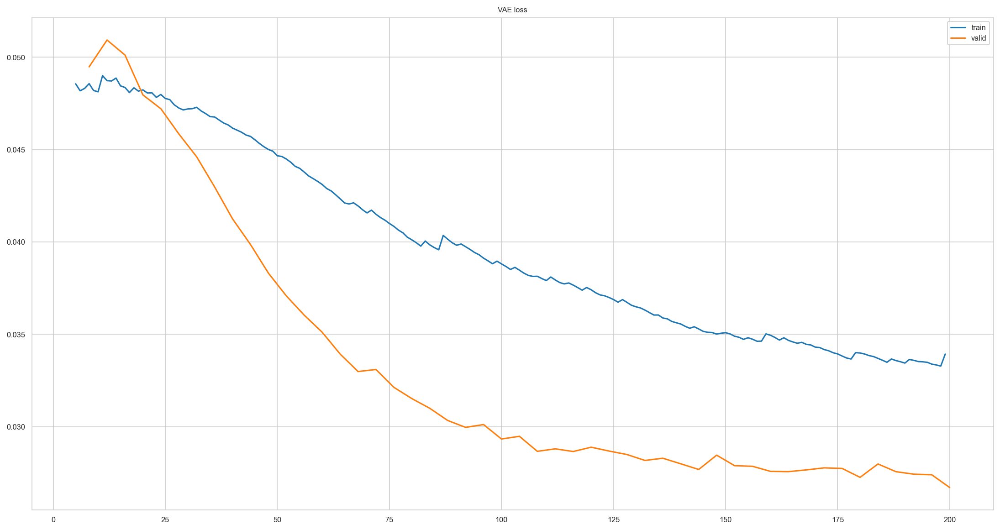

In [54]:
regions = ["hihm","himm", "hilm", "mihm", "mimm", "milm", "lihm", "limm", "whole"]
data_types = ["trs", "tes"]
data_files = {region + "_" + data_type + "_na": f"{region}_{data_type}_na.csv" for region in regions for data_type in data_types}

for region in regions:
    for data_type in data_types:
        file_key = f"{region}_{data_type}_na"
        file_name = data_files.get(file_key, f"{region}_{data_type}.csv")
        
        print(f"Processing {region}_{data_type}")
        print(f"Train_X shape: {splits.train_X.shape}")
        if hasattr(splits, 'val_y') and splits.val_y is not None:
            print(f"Val_Y shape: {splits.val_y.shape}")
        else:
            print(f"Warning: splits.val_y is missing for {region}_{data_type}")


        df = pd.read_csv(file_name, index_col=0)
        df.index.name = index_name  # already set
        df.columns.name = column_name  # not set due to csv disk file format

        if select_features:
        # potentially this can take a few iterations to stabilize.
            df = pimmslearn.filter.select_features(df, feat_prevalence=feat_prevalence)
            df = pimmslearn.filter.select_features(df=df, feat_prevalence=sample_completeness, axis=1)
        df.shape
        
        df = df.stack().to_frame('intensity')  # Convert to long format
        
        if sample_splits:
            splits, thresholds, fake_na_mcar, fake_na_mnar = pimmslearn.sampling.sample_mnar_mcar(
                df_long=df,
                frac_non_train=frac_non_train,
                frac_mnar=frac_mnar,
                random_state=random_state,
            )
            splits = pimmslearn.sampling.check_split_integrity(splits)
        else:
            splits = pimmslearn.sampling.DataSplits(is_wide_format=False)
            splits.train_X = df
            splits.val_y = df.copy()
        
        # Check if train_X is empty
        if splits.train_X.empty:
            raise ValueError(f"Train dataset is empty for {region}_{data_type}. Check data processing!")

        # Debug data structure
        print(f"Train_X shape: {splits.train_X.shape}")
        print(splits.train_X.head())

        # Use wide format of data
        splits.to_wide_format()
        splits.train_X

        if splits.val_y is not None:
            splits.val_y = pd.DataFrame(pd.NA, index=splits.train_X.index,
                                columns=splits.train_X.columns).fillna(splits.val_y)

            print(splits.train_X.shape, splits.val_y.shape)
        
        print("Selected model: VAE")
        model = AETransformer(
            model='VAE',
            hidden_layers=[512,],
            latent_dim=50,
            out_folder='runs/scikit_interface',
            batch_size=10,
        )
        
        model.fit(splits.train_X, splits.val_y,
          epochs_max=50,
          cuda=False)
        
        df_imputed = model.transform(splits.train_X).stack()

        splits.to_long_format()
        df_imputed = df_imputed.replace(splits.val_y).replace(splits.test_y)
        df_imputed

        #export data
        df_imputed = df_imputed.unstack()  # back to wide-format
        df_imputed.T.to_csv(f'{region}_{data_type}_vae.csv', index=True)

In [478]:
# Use wide format of data
splits.to_wide_format()
splits.train_X

intensity  \
protein group                                         AAADTLQGPM[15.9949]QAAYR   
Sample ID                                                                        
Hela_100ng_10_11_2023_Slot1_95_11495.MaxLFQ.Intensity                      NaN   
Hela_100ng_10_12_2023_Slot1_93_11527.MaxLFQ.Intensity                      NaN   
Hela_100ng_10_12_2023_Slot1_94_11511.MaxLFQ.Intensity                      NaN   
Hela_100ng_10_13_2023_Slot1_92_11543.MaxLFQ.Intensity                      NaN   
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity                      NaN   
...                                                                        ...   
Hela_100ng_11_6_2023_Slot2_89_12021.MaxLFQ.Intensity                       NaN   
Hela_100ng_11_7_2023_Slot2_95_12047.MaxLFQ.Intensity                       NaN   
Hela_100ng_11_8_2023_Slot2_93_12079.MaxLFQ.Intensity                       NaN   
Hela_100ng_11_8_2023_Slot2_94_12063.MaxLFQ.Intensity                       NaN   
Hela_100ng_11_9_2023_Slot2_92_12095.MaxLFQ.Intensity                       NaN   

                                                                       \
protein group                                         AAEEEEVDSADTGER   
Sample ID                                                               
Hela_100ng_10_11_2023_Slot1_95_11495.MaxLFQ.Intensity             NaN   
Hela_100ng_10_12_2023_Slot1_93_11527.MaxLFQ.Intensity             NaN   
Hela_100ng_10_12_2023_Slot1_94_11511.MaxLFQ.Intensity             NaN   
Hela_100ng_10_13_2023_Slot1_92_11543.MaxLFQ.Intensity             NaN   
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity             NaN   
...                                                               ...   
Hela_100ng_11_6_2023_Slot2_89_12021.MaxLFQ.Intensity           17.948   
Hela_100ng_11_7_2023_Slot2_95_12047.MaxLFQ.Intensity           17.908   
Hela_100ng_11_8_2023_Slot2_93_12079.MaxLFQ.Intensity              NaN   
Hela_100ng_11_8_2023_Slot2_94_12063.MaxLFQ.Intensity           17.989   
Hela_100ng_11_9_2023_Slot2_92_12095.MaxLFQ.Intensity           17.843   

                                                                  \
protein group                                         AAEFNSNLNR   
Sample ID                                                          
Hela_100ng_10_11_2023_Slot1_95_11495.MaxLFQ.Intensity        NaN   
Hela_100ng_10_12_2023_Slot1_93_11527.MaxLFQ.Intensity        NaN   
Hela_100ng_10_12_2023_Slot1_94_11511.MaxLFQ.Intensity        NaN   
Hela_100ng_10_13_2023_Slot1_92_11543.MaxLFQ.Intensity        NaN   
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity        NaN   
...                                                          ...   
Hela_100ng_11_6_2023_Slot2_89_12021.MaxLFQ.Intensity         NaN   
Hela_100ng_11_7_2023_Slot2_95_12047.MaxLFQ.Intensity         NaN   
Hela_100ng_11_8_2023_Slot2_93_12079.MaxLFQ.Intensity         NaN   
Hela_100ng_11_8_2023_Slot2_94_12063.MaxLFQ.Intensity         NaN   
Hela_100ng_11_9_2023_Slot2_92_12095.MaxLFQ.Intensity         NaN   

                                                                        \
protein group                                         AALEEVYPDLTPEETR   
Sample ID                                                                
Hela_100ng_10_11_2023_Slot1_95_11495.MaxLFQ.Intensity              NaN   
Hela_100ng_10_12_2023_Slot1_93_11527.MaxLFQ.Intensity              NaN   
Hela_100ng_10_12_2023_Slot1_94_11511.MaxLFQ.Intensity              NaN   
Hela_100ng_10_13_2023_Slot1_92_11543.MaxLFQ.Intensity              NaN   
Hela_100ng_10_14_2023_Slot1_91_11559.MaxLFQ.Intensity              NaN   
...                                                                ...   
Hela_100ng_11_6_2023_Slot2_89_12021.MaxLFQ.Intensity               NaN   
Hela_100ng_11_7_2023_Slot2_95_12047.MaxLFQ.Intensity               NaN   
Hela_100ng_11_8_2023_Slot2_93_12079.MaxLFQ.Intensity               NaN   
Hela_100ng_11_8_2023_Slot2_94_12063.MaxLFQ.Intensity    

Validation data for early stopping (if specified)

In [479]:
splits.val_y

Training and validation need the same shape:

In [480]:
if splits.val_y is not None:
    splits.val_y = pd.DataFrame(pd.NA, index=splits.train_X.index,
                                columns=splits.train_X.columns).fillna(splits.val_y)

    print(splits.train_X.shape, splits.val_y.shape)

Select either `DAE` or `VAE` model by chance:

In [481]:
model_selected = random.choice(['DAE', 'VAE'])
print("Selected model by chance:", model_selected)
model = AETransformer(
    model=model_selected,
    hidden_layers=[512,],
    latent_dim=50,
    out_folder='runs/scikit_interface',
    batch_size=10,
)

Selected model by chance: DAE


d:\Anaconda\envs\pimms\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
d:\Anaconda\envs\pimms\Lib\site-packages\fastai\learner.py:51: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Ple

epoch,train_loss,valid_loss,time
0,550622.562500,None,00:02
1,528588.812500,None,00:02
2,497978.187500,None,00:02
3,461313.468750,None,00:02
4,434296.406250,None,00:02
5,405282.500000,None,00:02
6,381647.656250,None,00:02
7,359098.312500,None,00:02
8,343171.656250,None,00:02
9,335849.843750,None,00:02


pimmslearn.plotting - INFO     Saved Figures to runs\scikit_interface\dae_training


AETransformer(batch_size=10, hidden_layers=[512], latent_dim=50,
              model=<class 'pimmslearn.models.ae.Autoencoder'>,
              out_folder=Path('runs/scikit_interface'))

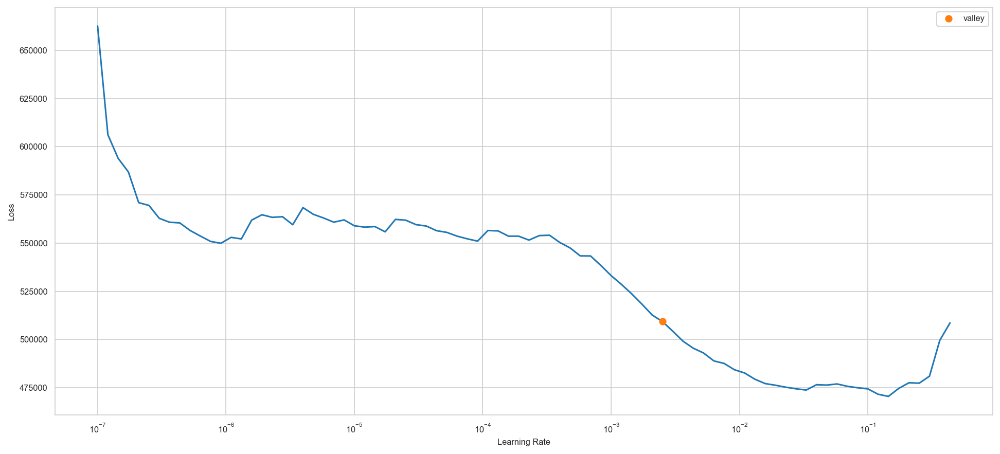

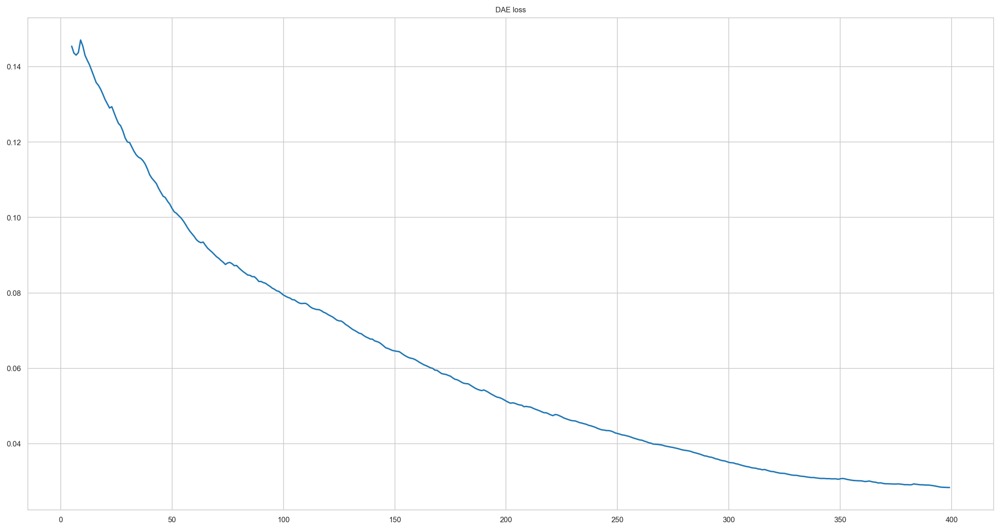

In [482]:
model.fit(splits.train_X, splits.val_y,
          epochs_max=50,
          cuda=False)

Impute missing values using `transform` method:

In [483]:
df_imputed = model.transform(splits.train_X).stack()
df_imputed

C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_56316\2328504207.py:1: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df_imputed = model.transform(splits.train_X).stack()


intensity
Sample ID                                             protein group                                                                        
Hela_100ng_10_11_2023_Slot1_95_11495.MaxLFQ.Intensity AAADTLQGPM[15.9949]QAAYR                                                       18.214
                                                      AAEEEEVDSADTGER                                                                17.931
                                                      AAEFNSNLNR                                                                     16.761
                                                      AALEEVYPDLTPEETR                                                               18.353
                                                      ADPAELR                                                                         9.337
...                                                                                                                                     ...
Hela_100ng_11_9_2023_Slot2_92_12095.MaxLFQ.Intensity  YYEDKPQGGAC[57.0215]AGLK                                                       11.673
                                                      n[42.0106]DPNC[57.0215]SC[57.0215]ATGGSC[57.0215]TC[57.0215]AGSC[57.0215]K      9.303
                                                      n[42.0106]MEGLVVAAGGDVSLHNFSAR                                                 12.247
                                                      n[42.0106]MMTSVSSDHC[57.0215]R                                                 11.957
                                                      n[42.0106]STASSSSSSSSSQTPHPPSQR                                                11.625

[8323280 rows x 1 columns]

Evaluate the model using the validation data:

In [484]:
if splits.val_y is not None:
    pred_val = splits.val_y.stack().to_frame('observed')
    pred_val[model_selected] = df_imputed
    val_metrics = pimmslearn.models.calculte_metrics(pred_val, 'observed')
    display(val_metrics)

    fig, ax = plt.subplots(figsize=(8, 2))

    ax, errors_binned = pimmslearn.plotting.errors.plot_errors_by_median(
        pred=pred_val,
        target_col='observed',
        feat_medians=splits.train_X.median(),
        ax=ax,
        metric_name='MAE',
        palette=color_model_mapping)

replace predicted values with validation data values

In [485]:
splits.to_long_format()
df_imputed = df_imputed.replace(splits.val_y).replace(splits.test_y)
df_imputed

C:\Users\ys25.stu\OneDrive - UBC\BeeCSI\Proteomics\imputation\reference\Webel.2024\env_pimms\pimms\pimmslearn\io\datasplits.py:139: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  _series = _df.stack()
C:\Users\ys25.stu\AppData\Local\Temp\ipykernel_56316\48148218.py:2: FutureWarning: DataFrame.replace without 'value' and with non-dict-like 'to_replace' is deprecated and will raise in a future version. Explicitly specify the new values instead.
  df_imputed = df_imputed.replace(splits.val_y).replace(splits.test_y)


intensity
Sample ID                                             protein group                                                                        
Hela_100ng_10_11_2023_Slot1_95_11495.MaxLFQ.Intensity AAADTLQGPM[15.9949]QAAYR                                                       18.214
                                                      AAEEEEVDSADTGER                                                                17.931
                                                      AAEFNSNLNR                                                                     16.761
                                                      AALEEVYPDLTPEETR                                                               18.353
                                                      ADPAELR                                                                         9.337
...                                                                                                                                     ...
Hela_100ng_11_9_2023_Slot2_92_12095.MaxLFQ.Intensity  YYEDKPQGGAC[57.0215]AGLK                                                       11.673
                                                      n[42.0106]DPNC[57.0215]SC[57.0215]ATGGSC[57.0215]TC[57.0215]AGSC[57.0215]K      9.303
                                                      n[42.0106]MEGLVVAAGGDVSLHNFSAR                                                 12.247
                                                      n[42.0106]MMTSVSSDHC[57.0215]R                                                 11.957
                                                      n[42.0106]STASSSSSSSSSQTPHPPSQR                                                11.625

[8323280 rows x 1 columns]